In [4]:
import warnings
import statistics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.io import arff
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_mutual_info_score,
    fowlkes_mallows_score,
    adjusted_rand_score,
)
from sklearn.feature_selection import mutual_info_classif, SelectKBest, VarianceThreshold
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.model_selection import GridSearchCV

warnings.filterwarnings("ignore")

In [3]:
pip install -U scikit-fuzzy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894077 sha256=9d17fff3e3cf4878c5dd7946f892cf863392689760d27a1c4dd8cccd2503a459
  Stored in directory: /root/.cache/pip/wheels/4f/86/1b/dfd97134a2c8313e519bcebd95d3fedc7be7944db022094bc8
Successfully built scikit-fuzzy


In [5]:
def clean_data(dframe, is_labeled=True):
    """
    Cleans the DataFrame by handling missing values, dropping columns with constant values,
    and label encoding categorical columns.

    Parameters:
    - dframe: Original DataFrame
    - is_labeled: Boolean indicating whether the DataFrame is labeled or unlabeled

    Returns:
    - Cleaned DataFrame
    """
    df = dframe.copy()

    # Fill missing values with mean for numeric columns
    for column in df.columns:
        if df[column].dtype != object:
            df[column] = df[column].fillna(df[column].mean())

    # Drop columns with constant values
    columns_to_drop = [col for col in df.columns if len(df[col].unique()) == 1]
    df.drop(columns=columns_to_drop, inplace=True)

    # Label encode text label columns
    for column_name in df.columns:
        if df[column_name].dtype == object:
            df[column_name] = LabelEncoder().fit_transform(df[column_name])

    # Check if the last column is label encoded or not
    if is_labeled and (df.iloc[:, -1].dtype == object or df.iloc[:, -1].dtype == bool):
        print("Last column is not label encoded. Label encoding it now...")
        df.iloc[:, -1] = LabelEncoder().fit_transform(df.iloc[:, -1])

    return df

def normalize_columns(df, list_of_columns, is_labeled=True):
    """
    Normalizes specified columns using StandardScaler.

    Parameters:
    - df: Original DataFrame
    - list_of_columns: List of columns to normalize

    Returns:
    - DataFrame with normalized columns
    """
    dframe = df.copy()
    if len(list_of_columns) > 0:
        # If the dataset is labeled and the last column is not to be normalized
        if is_labeled:
            last_column = dframe.columns[-1]
            list_of_columns = [col for col in list_of_columns if col != last_column]

            # Normalize the specified columns
        for column_name in list_of_columns:
            dframe[column_name] = StandardScaler().fit_transform(dframe[column_name].values.reshape(-1, 1))

    return dframe

def feature_selection_variance_threshold(df, t_value, is_labeled=True):
    """
    Perform feature selection using VarianceThreshold.

    Parameters:
    - df: Original DataFrame
    - t_value: Threshold value for variance

    Returns:
    - DataFrame with selected features
    """
    dframe = df.copy()
    selector = VarianceThreshold(threshold=t_value)
    # Separate the target variable (last column)
    if is_labeled:
        target_column = df.columns[-1]
        X = df.drop(columns=[target_column])
        y = df[target_column]
        # Create a VarianceThreshold selector
        # Fit the selector to the features
        X_selected = selector.fit_transform(X)
        # Get the indices of the selected features
        features_to_keep = selector.get_support(indices=True)
        # Select the features using the indices
        selected_features = X.iloc[:, features_to_keep]
        # Concatenate the selected features with the target column
        result_df = pd.concat([selected_features, y], axis=1)
        return result_df
    else:
        selector.fit(dframe)
        features_to_keep = selector.get_support(indices=True)
        return dframe.iloc[:,features_to_keep]

def feature_selection_k_best(df, k_value, is_labeled=True):
    """
    Perform feature selection using SelectKBest with mutual_info_classif.

    Parameters:
    - df: Original DataFrame
    - k_value: Number of top features to select

    Returns:
    - DataFrame with selected features
    """
    if is_labeled:
    # Separate the target variable (last column)
        target_column = df.columns[-1]
        X = df.drop(columns=[target_column])
        y = df[target_column]
    else:
        X = df.copy()
        y = np.zeros(df.shape[0])

    # Create a SelectKBest selector
    selector = SelectKBest(score_func=mutual_info_classif, k=k_value)

    # Fit the selector to the features
    X_selected = selector.fit_transform(X, y)

    # Get the indices of the selected features
    features_to_keep = selector.get_support(indices=True)

    # Select the features using the indices
    selected_features = X.iloc[:, features_to_keep]

    if is_labeled:
        # Concatenate the selected features with the target column
        result_df = pd.concat([selected_features, y], axis=1)
        return result_df
    else:
        selected_feature_names = X.columns[features_to_keep]
    return X[selected_feature_names]

In [15]:
labeled_datasets, unlabeled_datasets, cleaned_labeled_datasets, cleaned_unlabeled_datasets = [], [], [], []

# labeled Datasets
online_shoppers_intention = pd.read_csv('datasets/D3-OnlineShoppersIntention.csv')
labeled_datasets.append(("Online Shoppers Intention Dataset", online_shoppers_intention))

htru2 = pd.read_csv('datasets/HTRU_2.csv')
labeled_datasets.append(("Pulsar Dataset", htru2))

shill_bidding = pd.read_csv('datasets/Shill Bidding Dataset.csv')
labeled_datasets.append(("Shill Bidding Dataset", shill_bidding))

electrical_grid_large = pd.read_csv('datasets/D2-ElectricGrid.csv')
labeled_datasets.append(("Electrical Grid Large Dataset", electrical_grid_large))

rice = arff.loadarff("datasets/D1-RiceCammeoOsmancik.arff")
rice_dataset = pd.DataFrame(rice[0])
labeled_datasets.append(("Rice Dataset", rice_dataset))

eye_state = arff.loadarff("datasets/EEG Eye State.arff")
eye_state_dataset = pd.DataFrame(eye_state[0])
labeled_datasets.append(("Eye State Dataset", eye_state_dataset))

maternal_health_risk = pd.read_csv('datasets/Maternal Health Risk Data Set.csv')
labeled_datasets.append(("Maternal Health Risk Dataset", maternal_health_risk))

wifi_localization = pd.read_csv('datasets/wifi_localization.txt', sep='\t')
labeled_datasets.append(("Wifi Localization", wifi_localization))

apartments_for_rent_classified_10K = pd.read_csv('datasets/apartments_for_rent_classified_10K.csv', sep=";", encoding='cp1252')
labeled_datasets.append(("Apartments For Rent", apartments_for_rent_classified_10K))

print("Labeled Datasets")

for dataset_name, dataset in labeled_datasets:
    print("\n\n=======================================")
    print(f"Dataset: {dataset_name}")
    print("=======================================\n\n")
    print(dataset)

    cleaned_data = clean_data(dataset, is_labeled=True)
    normalized_data = normalize_columns(cleaned_data, cleaned_data.columns[:-1].tolist(), is_labeled=True)
    var_selected_data = feature_selection_variance_threshold(normalized_data, 0.2, is_labeled=True)
    k_best_selected_data = feature_selection_k_best(var_selected_data, var_selected_data.shape[1] - 1, is_labeled=True)
    cleaned_labeled_datasets.append((dataset_name, k_best_selected_data))

    unique_labels = k_best_selected_data.iloc[:, -1].unique()
    print("Unique Labels:", unique_labels)

Labeled Datasets


Dataset: Online Shoppers Intention Dataset


       Administrative  Administrative_Duration  Informational  \
0                   0                      0.0              0   
1                   0                      0.0              0   
2                   0                      0.0              0   
3                   0                      0.0              0   
4                   0                      0.0              0   
...               ...                      ...            ...   
12325               3                    145.0              0   
12326               0                      0.0              0   
12327               0                      0.0              0   
12328               4                     75.0              0   
12329               0                      0.0              0   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                         0.0               1                 0.000000   
1      

In [17]:
# unlabeled Datasets
facebook = pd.read_csv('datasets/D3-Facebook.csv')
unlabeled_datasets.append(("Facebook Dataset", facebook))

file_names = ['gt_2011.csv', 'gt_2012.csv', 'gt_2013.csv', 'gt_2014.csv', 'gt_2015.csv']
combined_df = pd.DataFrame()
for file_name in file_names:
    temp_df = pd.read_csv('datasets/Gas turbine/' + file_name)
    gas_turbine = pd.concat([combined_df, temp_df], ignore_index=True)
unlabeled_datasets.append(("Gas Turbine Dataset", gas_turbine))

seoul_bike = pd.read_csv("datasets/D2-SeoulBikeData.csv", encoding='unicode_escape')
columns_to_drop=['Date']
seoul_bike = seoul_bike.drop(columns=columns_to_drop)
unlabeled_datasets.append(("Seoul Bike Dataset", seoul_bike))

hcvdat0 = pd.read_csv('datasets/hcvdat0.csv')
unlabeled_datasets.append(("HCV Dataset", hcvdat0))

Sales_Transactions_Dataset_Weekly = pd.read_csv('datasets/Sales_Transactions_Dataset_Weekly.csv')
unlabeled_datasets.append(("Sales Transaction Dataset", Sales_Transactions_Dataset_Weekly))

Wholesalecustomersdata = pd.read_csv('datasets/Wholesale customers data.csv')
unlabeled_datasets.append(("Wholesale Customers Dataset", Wholesalecustomersdata))


print("Unlabeled Datasets")

for dataset_name, dataset in unlabeled_datasets:
    print("\n\n=======================================")
    print(f"Dataset: {dataset_name}")
    print("=======================================\n\n")
    print(dataset)

    cleaned_data = clean_data(dataset, is_labeled=False)
    normalized_data = normalize_columns(cleaned_data, cleaned_data.columns.tolist(), is_labeled=False)
    var_selected_data = feature_selection_variance_threshold(normalized_data, 0.2, is_labeled=False)
    k_best_selected_data = feature_selection_k_best(var_selected_data, var_selected_data.shape[1] - 1, is_labeled=False)
    cleaned_unlabeled_datasets.append((dataset_name, k_best_selected_data))

Unlabeled Datasets


Dataset: Facebook Dataset


      status_id status_type status_published  num_reactions  num_comments  \
0             1       video   4/22/2018 6:00            529           512   
1             2       photo  4/21/2018 22:45            150             0   
2             3       video   4/21/2018 6:17            227           236   
3             4       photo   4/21/2018 2:29            111             0   
4             5       photo   4/18/2018 3:22            213             0   
...         ...         ...              ...            ...           ...   
7045       7046       photo   9/24/2016 2:58             89             0   
7046       7047       photo  9/23/2016 11:19             16             0   
7047       7048       photo  9/21/2016 23:03              2             0   
7048       7049       photo   9/20/2016 0:43            351            12   
7049       7050       photo  9/10/2016 10:30             17             0   

      num_shares  num_like

In [9]:
def cluster_kmeans(df, k_values=2):
    """
    Perform K-Means clustering on the given DataFrame for a range of K values.
    Output optimal K values based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - k_values: Maximum number of clusters to consider

    Output:
    - Print optimal K values and metrics
    - Write results to files
    """
    dframe = df.copy()
    k_values = range(2, k_values)

    # Hyperparameter tuning using GridSearchCV
    kmeans = KMeans()
    param_grid = {
        'n_clusters': [2, 3, 4, 5],
        'init': ['k-means++', 'random'],
        'max_iter': [100, 300, 500],
        'random_state': [0, 50]
    }
    grid_search = GridSearchCV(estimator=kmeans, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search.fit(X=dframe.iloc[:, :-1], y=dframe.iloc[:, -1])
    best_params = grid_search.best_params_
    print("\nBest K-Means Hyperparameters:", best_params)

    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores, wcss, dunn_indices = [], [], [], [], [], [], [], []

    for k in k_values:
        # Fit K-Means clustering with the current K value
        kmeans = KMeans(n_clusters=k, init=best_params['init'], max_iter=best_params['max_iter'], random_state=best_params['random_state'])
        kmeans.fit(dframe)
        wcss.append(kmeans.inertia_)

        # Evaluate clustering metrics
        silhouette_scores.append(silhouette_score(dframe, kmeans.labels_))
        dbi_scores.append(davies_bouldin_score(dframe, kmeans.labels_))
        ch_indices.append(calinski_harabasz_score(dframe, kmeans.labels_))
        ami_scores.append(adjusted_mutual_info_score(dframe.iloc[:, -1], kmeans.labels_))
        fm_scores.append(fowlkes_mallows_score(dframe.iloc[:, -1], kmeans.labels_))
        ar_scores.append(adjusted_rand_score(dframe.iloc[:, -1], kmeans.labels_))

        # Visualize cluster assignments for optimal K
        if k == best_params['n_clusters']:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=dframe.iloc[:, 0], y=dframe.iloc[:, 1], hue=kmeans.labels_, palette='viridis')
            plt.title(f'K-Means Clustering - {k} Clusters')
            plt.show()
            print("\n\n")

    # Visualize the Elbow Method
    plt.figure(figsize=(10, 6))
    plt.plot(k_values, wcss, marker='o')
    plt.title('Elbow Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Within-Cluster-Sum-of-Squares (WCSS)')
    plt.show()
    print("\n")

    # Find the K with the highest Dunn Index
    for k in k_values:
        kmeans = KMeans(n_clusters=k, init=best_params['init'], max_iter=best_params['max_iter'], random_state=best_params['random_state'])
        kmeans.fit(dframe.astype(np.float32))

        # Calculate the pairwise distances between data points
        distances = pairwise_distances(dframe.astype(np.float32))

        # Calculate the minimum inter-cluster distance
        min_inter_cluster_distance = np.inf
        for i in range(k):
            for j in range(i + 1, k):
                inter_cluster_distance = np.min(distances[np.where(kmeans.labels_ == i)][:, np.where(kmeans.labels_ == j)])
                min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        # Calculate the maximum intra-cluster diameter
        max_intra_cluster_diameter = max([np.max(distances[np.where(kmeans.labels_ == i)]) for i in range(k)])

        # Calculate the Dunn Index
        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    # Optimal K based on the Dunn Index
    optimal_k = k_values[np.argmax(dunn_indices)]

    optimal_k_silhouette = k_values[np.argmax(silhouette_scores)]
    optimal_k_dbi = k_values[np.argmin(dbi_scores)]
    optimal_k_ch = k_values[np.argmax(ch_indices)]
    slopes = [wcss[i] - wcss[i - 1] for i in range(1, len(wcss))]
    best_k = slopes.index(max(slopes)) + 1
    optimal_ami = k_values[np.argmax(ami_scores)]
    optimal_fm = k_values[np.argmax(fm_scores)]
    optimal_ar = k_values[np.argmax(ar_scores)]

    print("Best K value from Elbow Method:", best_k)
    print('Optimal Value of k from Silhouette Score:', optimal_k_silhouette, 'with score:', max(silhouette_scores))
    print('Optimal Value of k from Davies Bouldin Index:', optimal_k_dbi, 'with score:', min(dbi_scores))
    print('Optimal Value of k from Calinski Harabasz Index:', optimal_k_ch, 'with score:', max(ch_indices))
    print('Optimal Value of k from Adjusted Mutual Info:', optimal_ami, 'with score:', max(ami_scores))
    print('Optimal Value of k from Fowlkes Mallows Score:', optimal_fm, 'with score:', max(fm_scores))
    print('Optimal Value of k from Adjusted Rand Score:', optimal_ar, 'with score:', max(ar_scores))
    print("Dunn Index values for different K values:", dunn_indices)
    print("Optimal K based on Dunn Index:", optimal_k)
    print("\n\n")

In [10]:
def visualize_dendrogram(df):
    """
    Visualize dendrogram for hierarchical clustering.
    """
    linkage_matrix = linkage(df, method='ward', metric='euclidean')

    plt.figure(figsize=(10, 6))
    dendrogram(linkage_matrix, p=5, truncate_mode='level', orientation='top', show_leaf_counts=True, above_threshold_color='y')
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index or Cluster Size')
    plt.ylabel('Distance')
    plt.show()

def visualize_clusters(df, labels):
    """
    Visualize scatter plot for cluster.
    """
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df.iloc[:, 0], y=df.iloc[:, 1], hue=labels, palette='viridis', s=100)
    plt.title('Agglomerative Clustering')
    plt.show()

def cluster_agglomerative(df, k_values=2):
    """
    Perform Agglomerative clustering on the given DataFrame for a range of K values.
    Output optimal K values based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - k_values: Maximum number of clusters to consider

    Output:
    - Print optimal K values and metrics
    - Write results to files
    """
    dframe = df.copy()
    k_values = range(2, k_values)

    visualize_dendrogram(dframe)

    # Hyperparameter tuning using GridSearchCV
    agg_clustering = AgglomerativeClustering()
    param_grid = {
        'n_clusters': k_values,
        'linkage': ['ward', 'complete', 'average'],
    }
    grid_search = GridSearchCV(estimator=agg_clustering, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
    grid_search.fit(dframe)

    best_params = grid_search.best_params_
    print("\nBest Agglomerative Clustering Hyperparameters:", best_params)

    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores, dunn_indices = [], [], [], [], [], [], []

    true_labels = dframe.pop(dframe.columns[-1])

    for k in k_values:
        agg = AgglomerativeClustering(n_clusters=k, linkage=best_params['linkage'])
        agg.fit(dframe)
        silhouette_scores.append(silhouette_score(dframe, agg.labels_))
        dbi_scores.append(davies_bouldin_score(dframe, agg.labels_))
        ch_indices.append(calinski_harabasz_score(dframe, agg.labels_))
        predicted_labels = agg.labels_
        ami_scores.append(adjusted_mutual_info_score(true_labels, predicted_labels))
        fm_scores.append(fowlkes_mallows_score(true_labels, predicted_labels))
        ar_scores.append(adjusted_rand_score(true_labels, predicted_labels))

    optimal_k_silhouette = k_values[np.argmax(silhouette_scores)]
    optimal_k_dbi = k_values[np.argmin(dbi_scores)]
    optimal_k_ch = k_values[np.argmax(ch_indices)]
    optimal_ami = k_values[np.argmax(ami_scores)]
    optimal_fm = k_values[np.argmax(fm_scores)]
    optimal_ar = k_values[np.argmax(ar_scores)]

    agg_optimal = AgglomerativeClustering(n_clusters=optimal_k_silhouette, linkage=best_params['linkage'])
    optimal_labels = agg_optimal.fit_predict(dframe)
    visualize_clusters(dframe, optimal_labels)

    print('Optimal Value of k from Silhouette Score:', optimal_k_silhouette, 'with score:', max(silhouette_scores))
    print('Optimal Value of k from Davies Bouldin Index:', optimal_k_dbi, 'with score:', min(dbi_scores))
    print('Optimal Value of k from Calinski Harabasz Index:', optimal_k_ch, 'with score:', max(ch_indices))
    print('Optimal Value of k from Adjusted Mutual Info:', optimal_ami, 'with score:', max(ami_scores))
    print('Optimal Value of k from Fowlkes Mallows Score:', optimal_fm, 'with score:', max(fm_scores))
    print('Optimal Value of k from Adjusted Rand Score:', optimal_ar, 'with score:', max(ar_scores))

    dunn_indices = []
    df2 = dframe.astype(np.float32)

    for k in k_values:
        agg = AgglomerativeClustering(n_clusters=k, linkage='ward')
        agg.fit(dframe)

        distances = pairwise_distances(df2)
        min_inter_cluster_distance = np.inf
        for i in range(k):
            for j in range(i + 1, k):
                inter_cluster_distance = np.min(distances[np.where(agg.labels_ == i)][:, np.where(agg.labels_ == j)])
                min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        max_intra_cluster_diameter = max([np.max(distances[np.where(agg.labels_ == i)]) for i in range(k)])
        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    optimal_k = k_values[np.argmax(dunn_indices)]
    optimal_k_list = [optimal_k_silhouette, optimal_k_dbi, optimal_k_ch, optimal_ami, optimal_fm, optimal_ar, optimal_k]

    print("Dunn Index values for different K values:", dunn_indices)
    print("Optimal K based on Dunn Index:", optimal_k)
    print("\n\n")

In [11]:
def cluster_dbscan(df, eps_value=0.5):
    """
    Perform DBSCAN clustering on the given DataFrame for a range of epsilon and min_samples values.
    Output optimal parameters based on various metrics.

    Parameters:
    - df: DataFrame for clustering
    - eps_values: List of epsilon values to consider
    - min_samples_values: List of min_samples values to consider

    Output:
    - Print optimal parameters and metrics
    - Write results to files
    """

    dframe = df.copy()
    k_values = range(2, 7)
    dbscan = DBSCAN()

    param_grid = {
        'eps': [0.5, 1.0, 1.5, 2.0, 3.0, 4.0, 5.0],
        'min_samples': [5, 10, 15, 20],
        'metric': ['euclidean'],
    }

    # Perform grid search to find the best hyperparameters
    grid_search = GridSearchCV(estimator=dbscan, param_grid=param_grid, cv=5, scoring=silhouette_score)
    grid_search.fit(dframe)
    best_params = grid_search.best_params_
    print("Best DBSCAN Hyperparameters:", best_params)

    # Extract true labels for evaluation
    true_labels = dframe.pop(dframe.columns[-1])

    # Initialize lists to store evaluation metrics
    silhouette_scores, dbi_scores, ch_indices, ami_scores, fm_scores, ar_scores = [], [], [], [], [], []

    # Iterate over different values of epsilon
    for epsilon in param_grid['eps']:
        # Fit DBSCAN with the current epsilon value
        dbscan = DBSCAN(eps=epsilon, min_samples=best_params['min_samples'], metric=best_params['metric'])
        dbscan.fit(dframe)
        labels = set(dbscan.labels_)

        # Visualize cluster assignments for optimal epsilon
        if epsilon == best_params['eps']:
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=dframe.iloc[:, 0], y=dframe.iloc[:, 1], hue=dbscan.labels_, palette='viridis')
            plt.title(f'DBSCAN Clustering - Epsilon: {epsilon}')
            plt.show()

        # Check if there is more than one cluster
        if len(labels) == 1:
            continue

        # Calculate evaluation metrics
        silhouette_avg = silhouette_score(dframe, dbscan.labels_)
        silhouette_scores.append(silhouette_avg)

        dbi = davies_bouldin_score(dframe, dbscan.labels_)
        dbi_scores.append(dbi)

        ch_score = calinski_harabasz_score(dframe, dbscan.labels_)
        ch_indices.append(ch_score)

        predicted_labels = dbscan.labels_

        ami = adjusted_mutual_info_score(true_labels, predicted_labels)
        ami_scores.append(ami)

        fm = fowlkes_mallows_score(true_labels, predicted_labels)
        fm_scores.append(fm)

        ar = adjusted_rand_score(true_labels, predicted_labels)
        ar_scores.append(ar)

        if silhouette_scores:
            optimal_k_silhouette = param_grid['eps'][np.argmax(silhouette_scores)]
            print(f'Optimal Value of epsilon from Silhouette Score: {optimal_k_silhouette} with score: {max(silhouette_scores)}')

        if dbi_scores:
            optimal_k_dbi = param_grid['eps'][np.argmin(dbi_scores)]
            print(f'Optimal Value of epsilon from Davies Bouldin Index: {optimal_k_dbi} with score: {min(dbi_scores)}')

        if ch_indices:
            optimal_k_ch = param_grid['eps'][np.argmax(ch_indices)]
            print(f'Optimal Value of epsilon from Calinski Harabasz Index: {optimal_k_ch} with score: {max(ch_indices)}')

        if ami_scores:
            optimal_k_ami = param_grid['eps'][np.argmax(ami_scores)]
            print(f'Optimal Value of epsilon from Adjusted Mutual Info: {optimal_k_ami} with score: {max(ami_scores)}')

        if fm_scores:
            optimal_fm = param_grid['eps'][np.argmin(fm_scores)]
            print(f'Optimal Value of epsilon from Fowlkes Mallows Score: {optimal_fm} with score: {min(fm_scores)}')

        if ar_scores:
            optimal_ar = param_grid['eps'][np.argmax(ar_scores)]
            print(f'Optimal Value of epsilon from Adjusted Rand Score: {optimal_ar} with score: {max(ar_scores)}')

    # Perform Dunn Index calculation
    dunn_indices = []
    df2 = dframe.astype(np.float32)

    for epsilon in param_grid['eps']:
        dbscan = DBSCAN(eps=epsilon, min_samples=best_params['min_samples'], metric=best_params['metric'])
        dbscan.fit(dframe)
        labels = set(dbscan.labels_)

        if len(labels) == 1:
            continue

        distances = pairwise_distances(df2)
        min_inter_cluster_distance = np.inf
        cluster_indices = np.unique(dbscan.labels_)

        for i in range(len(cluster_indices)):
            for j in range(i + 1, len(cluster_indices)):
                cluster_i_indices = np.where(dbscan.labels_ == cluster_indices[i])[0]
                cluster_j_indices = np.where(dbscan.labels_ == cluster_indices[j])[0]

                if len(cluster_i_indices) > 0 and len(cluster_j_indices) > 0:
                    inter_cluster_distance = np.min(distances[cluster_i_indices][:, cluster_j_indices])
                    min_inter_cluster_distance = min(min_inter_cluster_distance, inter_cluster_distance)

        max_intra_cluster_diameter = max([np.max(distances[np.where(dbscan.labels_ == i)]) for i in cluster_indices])

        dunn_index = min_inter_cluster_distance / max_intra_cluster_diameter
        dunn_indices.append(dunn_index)

    if dunn_indices:
        optimal_k_dunn = param_grid['eps'][np.argmax(dunn_indices)]
        print("Dunn Index values for different epsilon values:", dunn_indices)
        print("Optimal epsilon based on Dunn Index:", optimal_k_dunn)
    else:
        print('No clusters found')

    print("\n\n")

Dataset: Online Shoppers Intention Dataset

Best K-Means Hyperparameters: {'init': 'random', 'max_iter': 100, 'n_clusters': 2, 'random_state': 50}


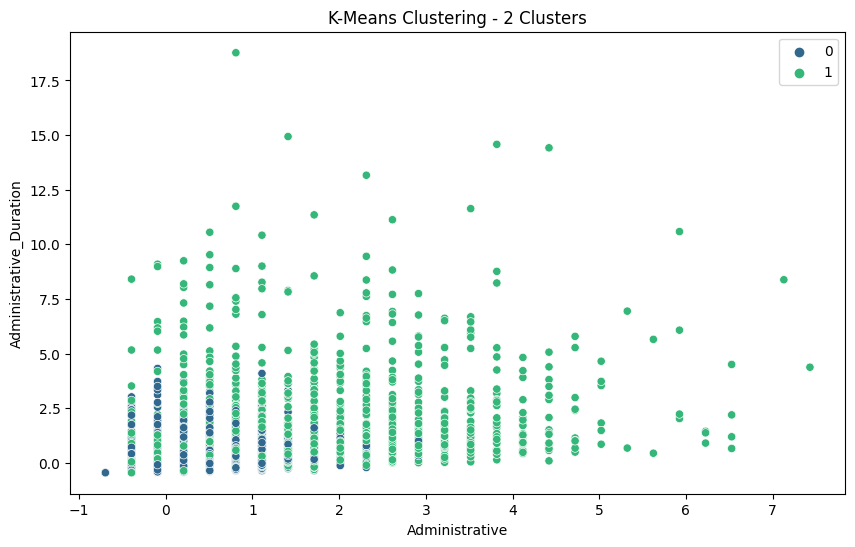

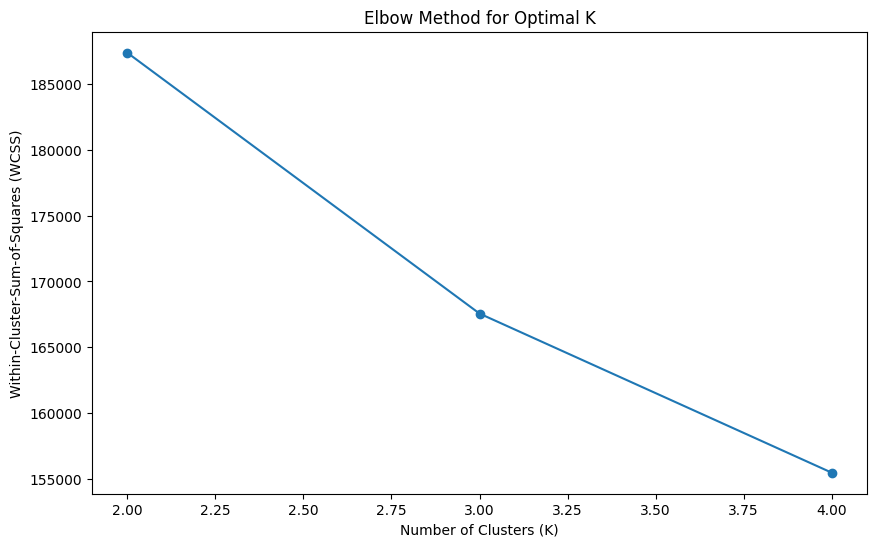



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.25859880695199056
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.7796653566655776
Optimal Value of k from Calinski Harabasz Index: 3 with score: 1606.0093487707343
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.0356285472021527
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7628555940533649
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.10216492371617192
Dunn Index values for different K values: [0.013150433, 0.0074030324, 0.0049766405]
Optimal K based on Dunn Index: 2





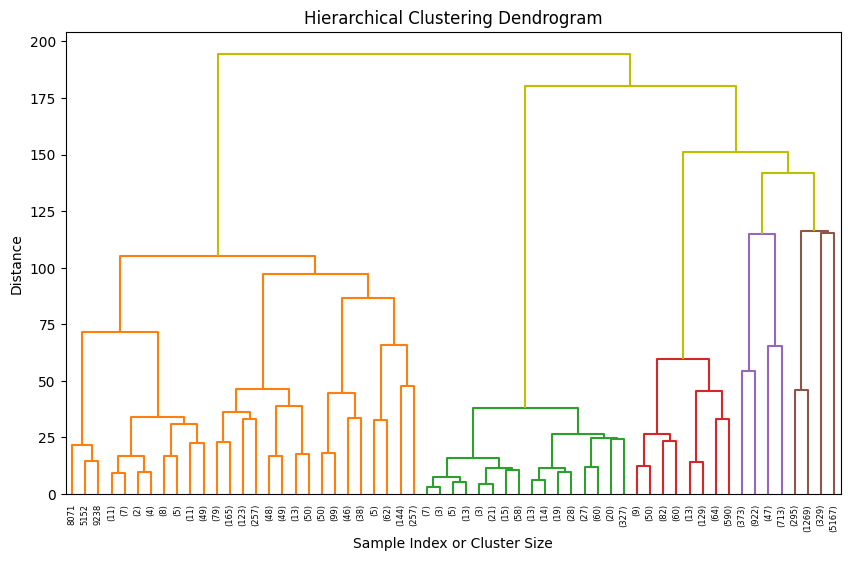


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


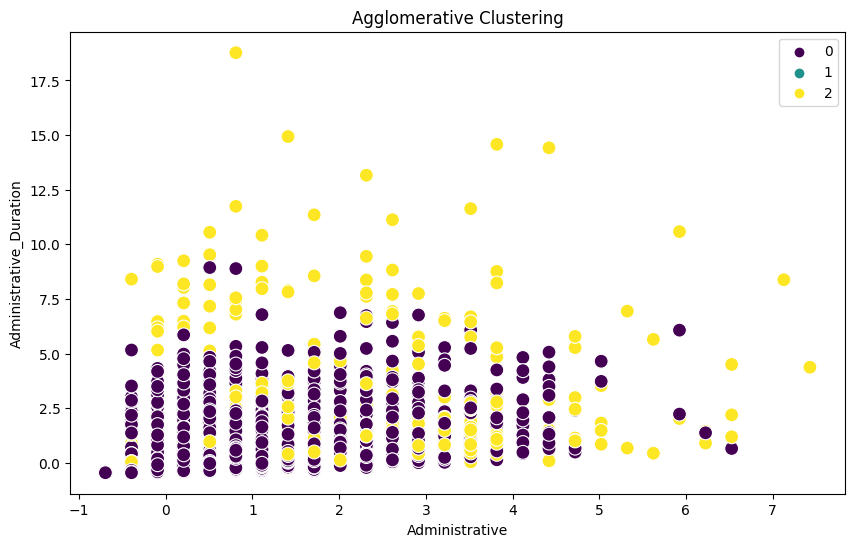

Optimal Value of k from Silhouette Score: 3 with score: 0.27550770241495776
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.2146693773012944
Optimal Value of k from Calinski Harabasz Index: 3 with score: 1292.045533628886
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.052156134276967685
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7926928824235927
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.10437814975639881
Dunn Index values for different K values: [0.011154718, 0.011154718, 0.011154718]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


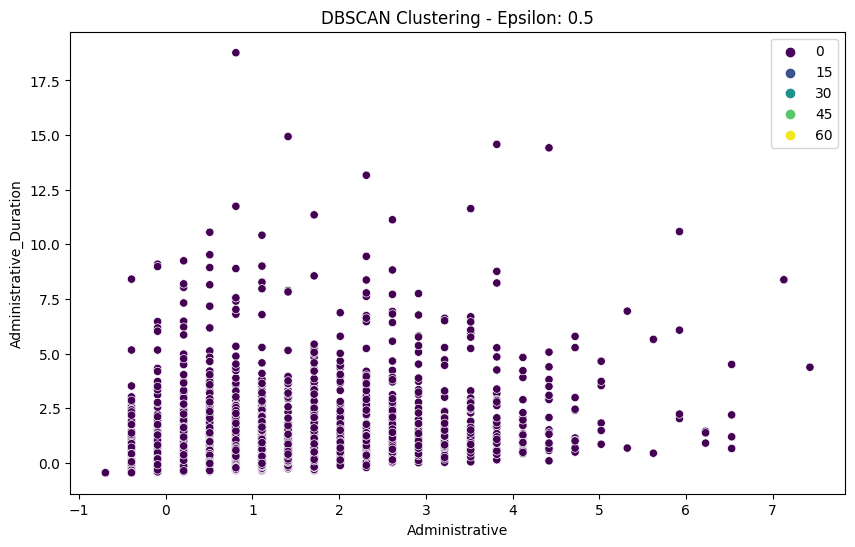

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.43312341134574395
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.454562052083496
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 14.526736121856313
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.020873862540784514
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.7553527667919142
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: -0.09071811861362411
Optimal Value of epsilon from Silhouette Score: 1.0 with score: -0.2766511295928104
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.454562052083496
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 40.13465683710238
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.027286473929595705
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.42887992408220493
Optimal Value of epsilon from Adjuste

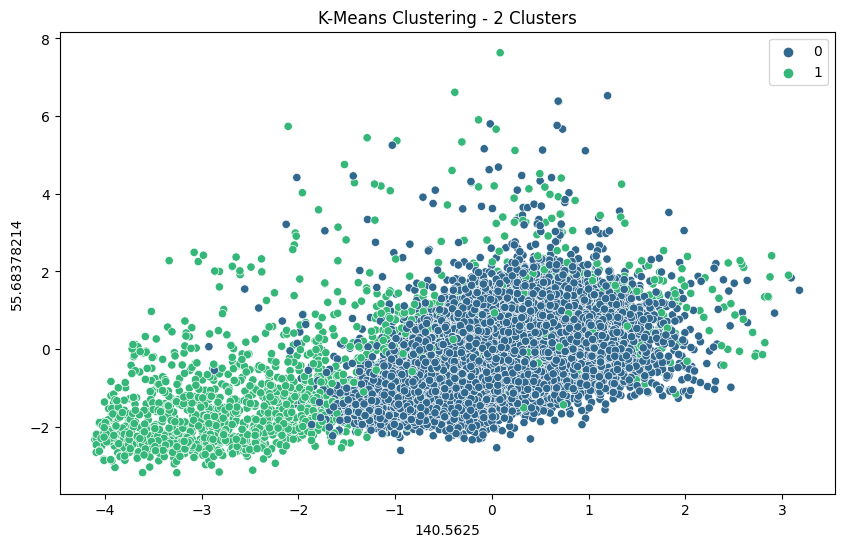

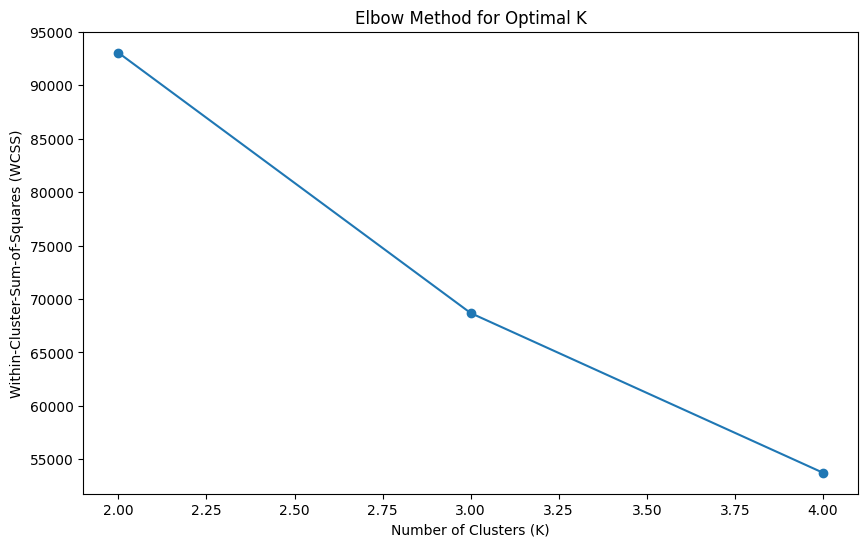



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.6025190582968746
Optimal Value of k from Davies Bouldin Index: 3 with score: 0.905477802931725
Optimal Value of k from Calinski Harabasz Index: 4 with score: 10090.396468139614
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.413158376882004
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.9289513256065509
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.6144187048577734
Dunn Index values for different K values: [0.009885337, 0.0046036853, 0.0034903323]
Optimal K based on Dunn Index: 2





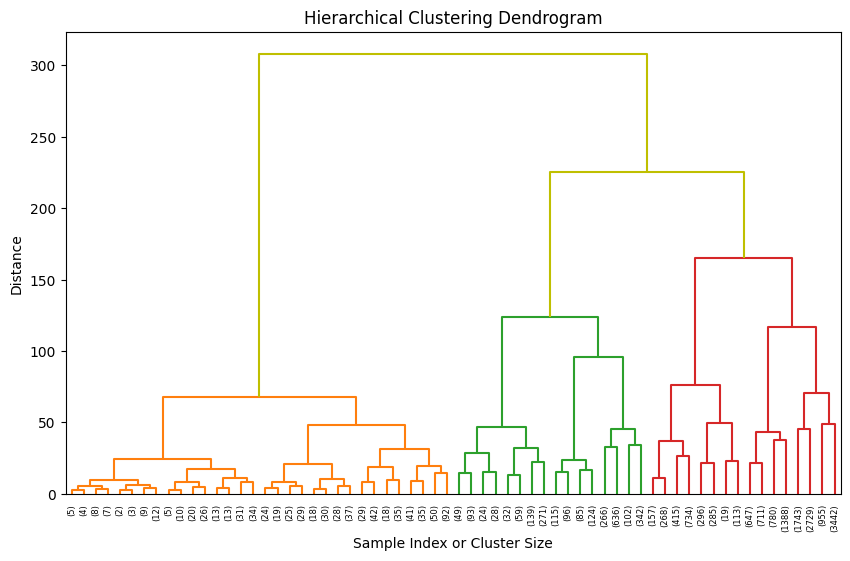


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


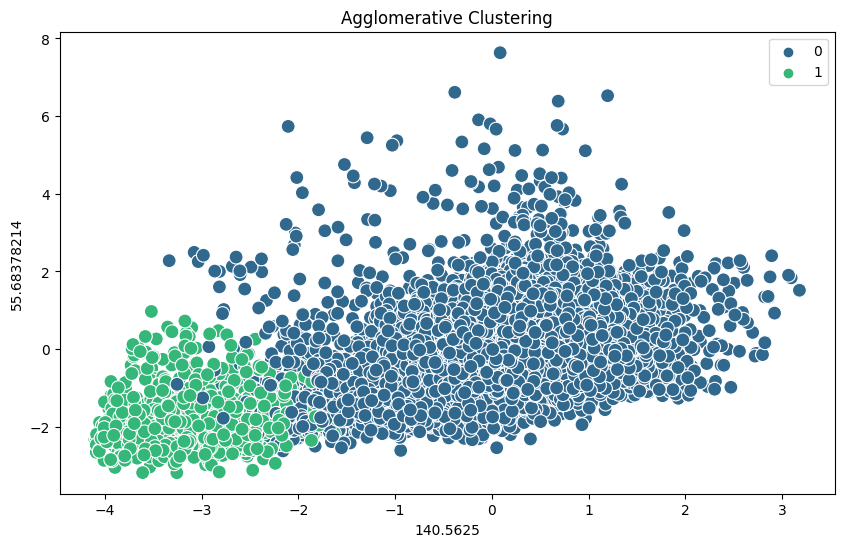

Optimal Value of k from Silhouette Score: 2 with score: 0.6633144848302793
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.5766073357315864
Optimal Value of k from Calinski Harabasz Index: 3 with score: 9135.355467286952
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.478716007529523
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.949833515016091
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.6031517133180908
Dunn Index values for different K values: [0.016460607, 0.010907767, 0.0050451155]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


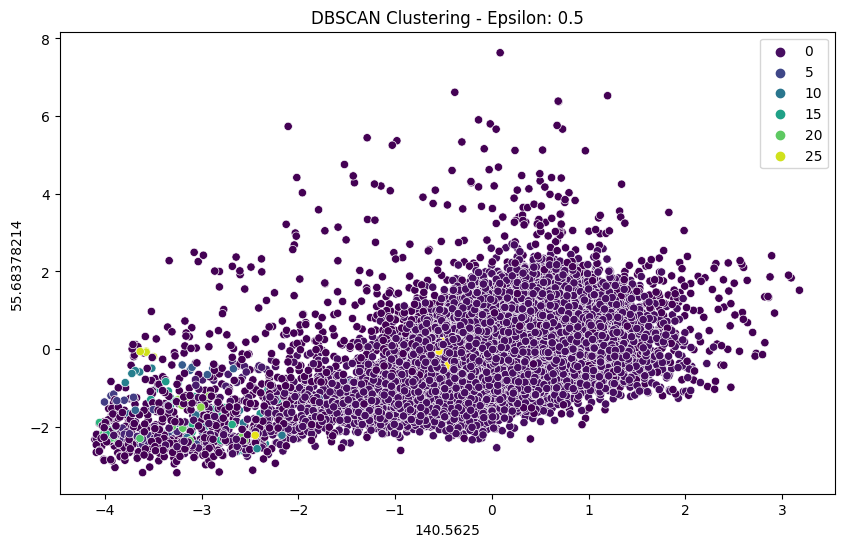

Optimal Value of epsilon from Silhouette Score: 0.5 with score: 0.19585178349957016
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.355682835408259
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 202.4910317762008
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.221462520730851
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.9044753145173572
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.43130644595585044
Optimal Value of epsilon from Silhouette Score: 1.0 with score: 0.5424542900803773
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.355682835408259
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 202.4910317762008
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.221462520730851
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.9044753145173572
Optimal Value of epsilon from Adjusted Rand Scor

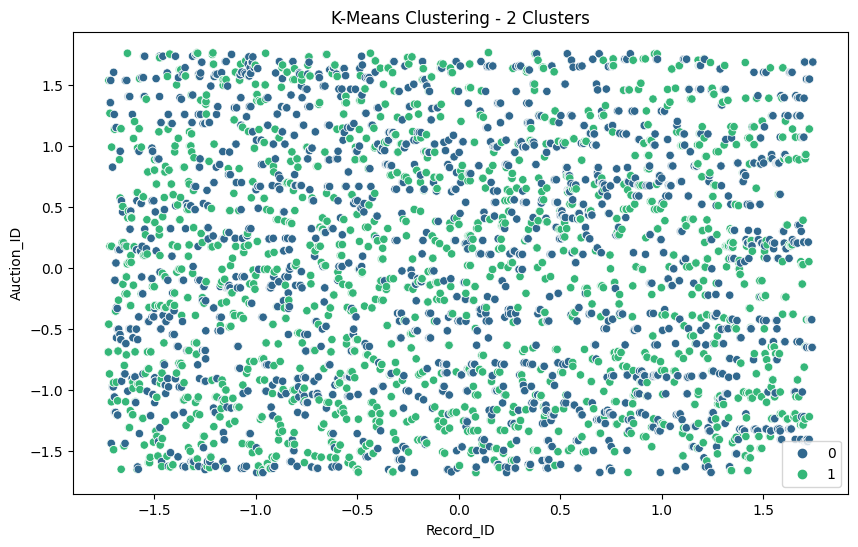

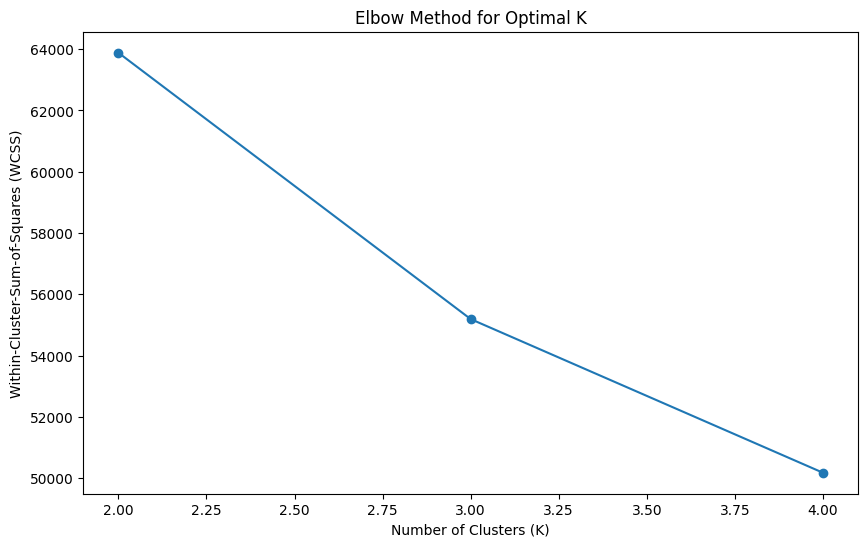



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 3 with score: 0.17782006162067696
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.8396068553795544
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1243.8097089256876
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.36595529317637027
Optimal Value of k from Fowlkes Mallows Score: 3 with score: 0.6863403623101766
Optimal Value of k from Adjusted Rand Score: 3 with score: 0.23475259549010485
Dunn Index values for different K values: [0.034795824, 0.03348986, 0.034640126]
Optimal K based on Dunn Index: 2





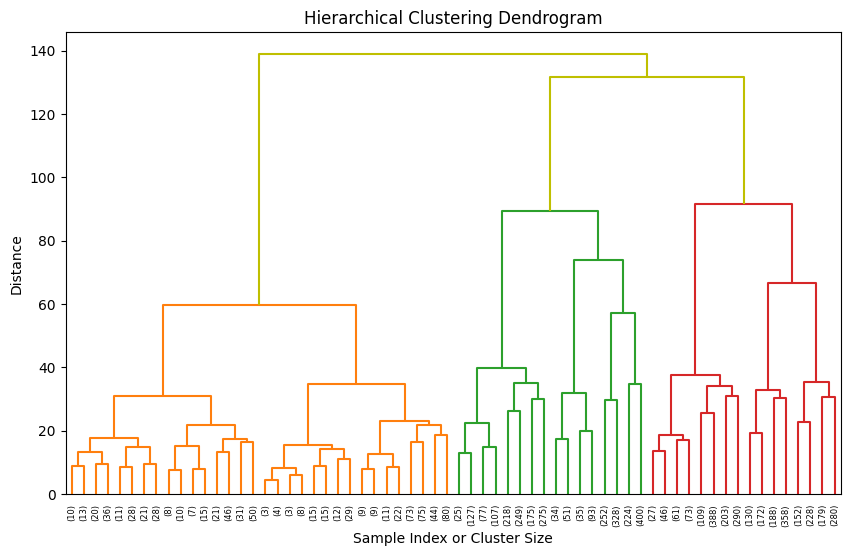


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


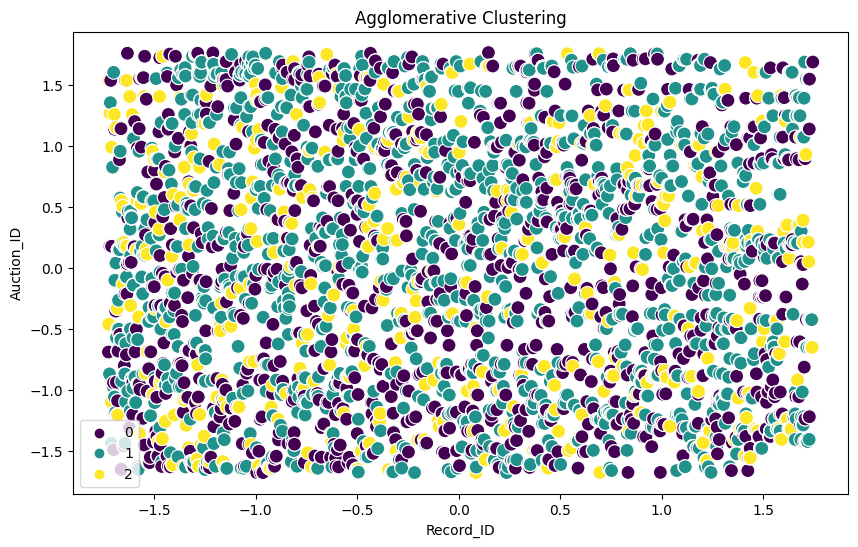

Optimal Value of k from Silhouette Score: 3 with score: 0.14802786929225512
Optimal Value of k from Davies Bouldin Index: 4 with score: 2.021799023964702
Optimal Value of k from Calinski Harabasz Index: 3 with score: 1000.2168581973103
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.28759039984608065
Optimal Value of k from Fowlkes Mallows Score: 3 with score: 0.6697793152088659
Optimal Value of k from Adjusted Rand Score: 3 with score: 0.2044516829651106
Dunn Index values for different K values: [0.05433787, 0.05433787, 0.05433787]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


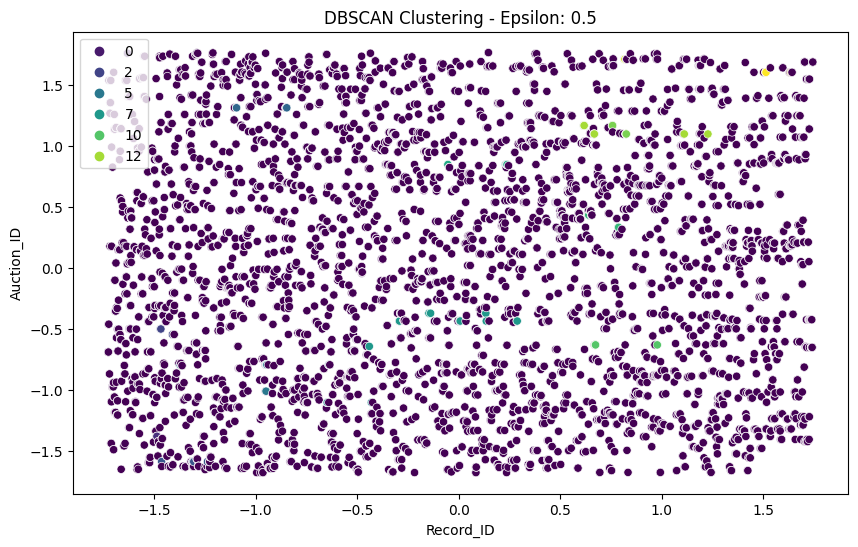

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.32294285170484877
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.1450178950893368
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 5.651303891678369
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.0015576530051970461
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.8835871857436011
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: -0.023252979293417582
Optimal Value of epsilon from Silhouette Score: 1.0 with score: -0.32278002763772723
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.1450178950893368
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 28.452272235897482
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.06255707841490578
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.4967821010428637
Optimal Value of epsilon from Adju

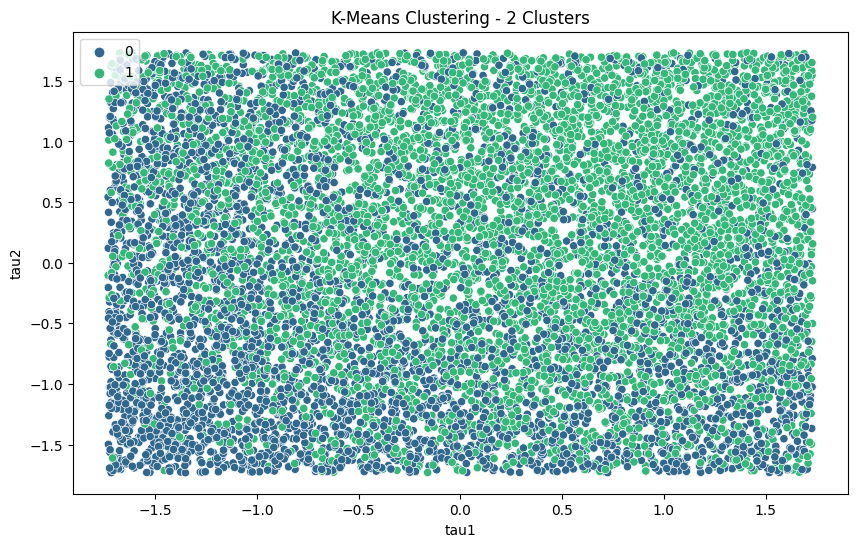

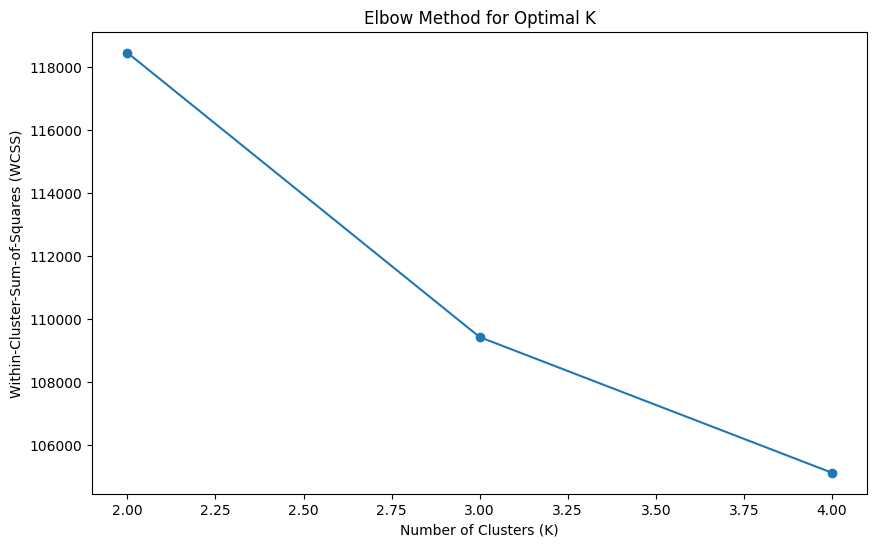



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.10341011472412094
Optimal Value of k from Davies Bouldin Index: 3 with score: 2.542448269137735
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1170.6106513535583
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.6249260554841038
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.8504472996517836
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.6861947692227016
Dunn Index values for different K values: [0.084174916, 0.0905376, 0.084174916]
Optimal K based on Dunn Index: 3





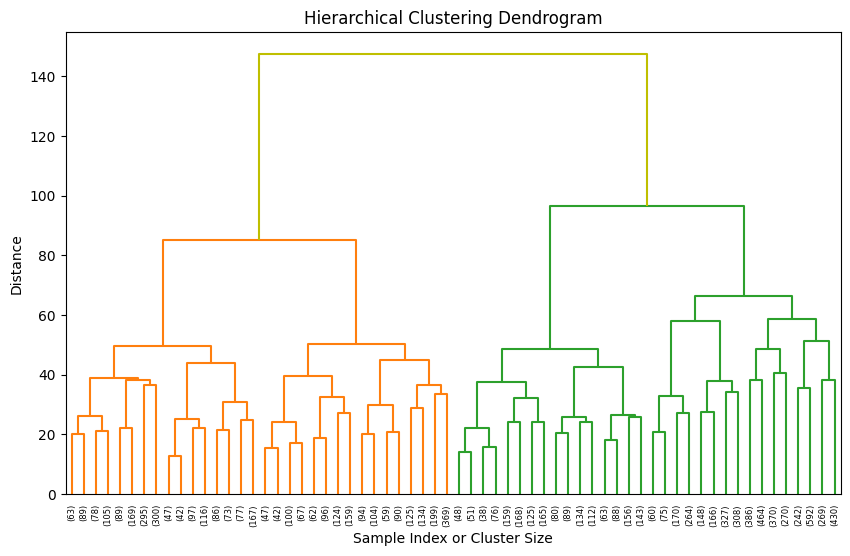


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


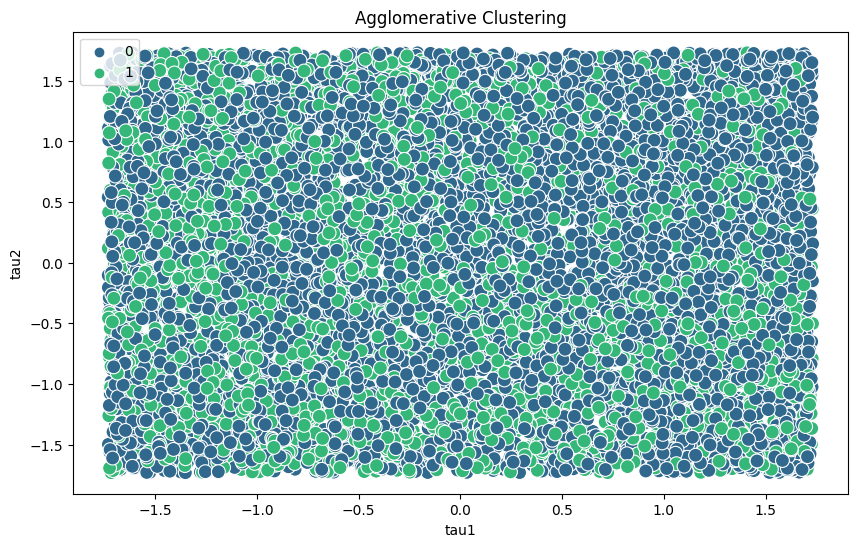

Optimal Value of k from Silhouette Score: 2 with score: 0.05715212891151482
Optimal Value of k from Davies Bouldin Index: 3 with score: 3.5674097862370897
Optimal Value of k from Calinski Harabasz Index: 2 with score: 619.9560108480737
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.12875572109685454
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.5670366252099378
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.11338652941126098
Dunn Index values for different K values: [0.12762631, 0.12551756, 0.12551756]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


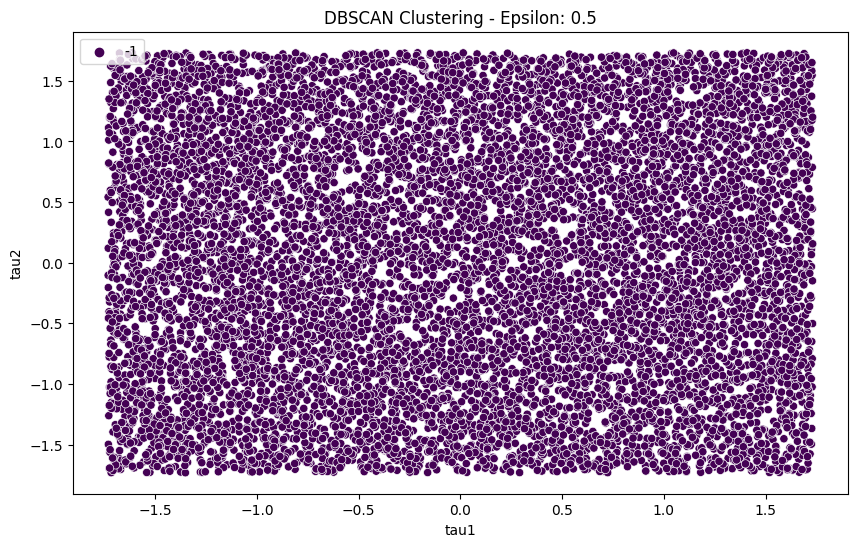

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.21667363270631154
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.6831207509012203
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 3.4864870958911167
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.0018901850749384614
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.7315258508208349
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: -0.0004873384346239755
Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.21667363270631154
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.6831207509012203
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 4.235149859941091
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.023187735602936594
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.6482294258457701
Optimal Value of epsilon from Ad

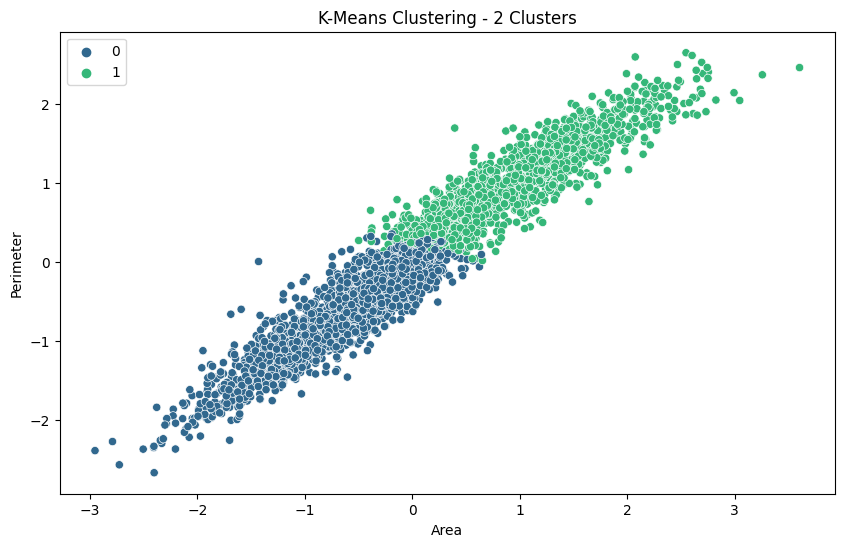

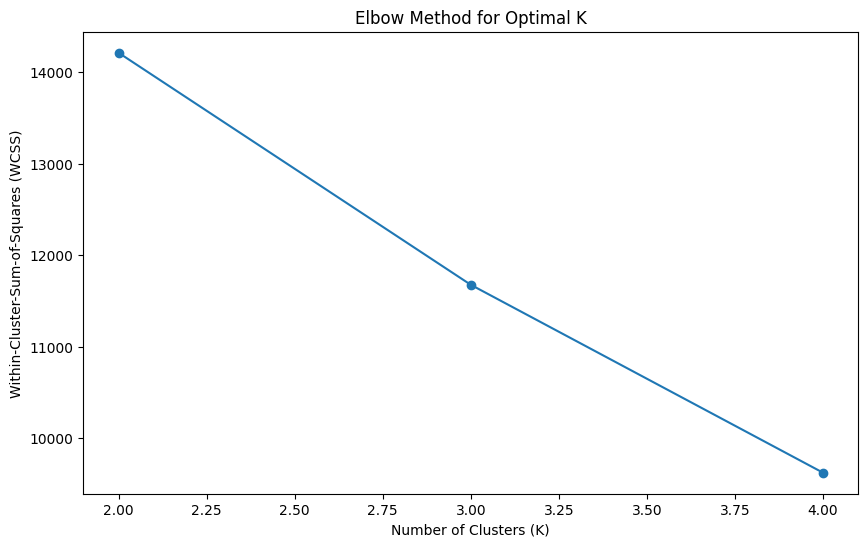



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.41746915142372887
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.9383742861528225
Optimal Value of k from Calinski Harabasz Index: 2 with score: 3587.413913999138
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.6036496110940845
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.8609840249190356
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.7149124831971515
Dunn Index values for different K values: [0.0066148005, 0.0064940406, 0.0066117835]
Optimal K based on Dunn Index: 2





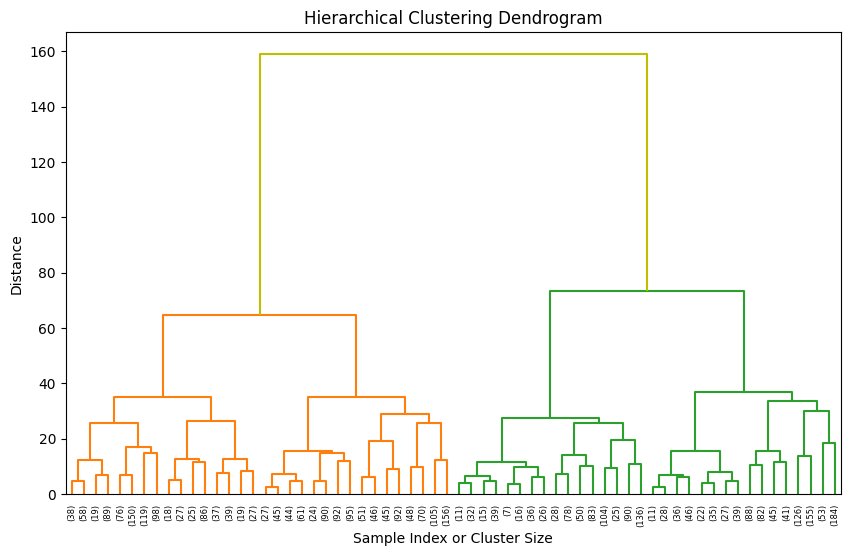


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


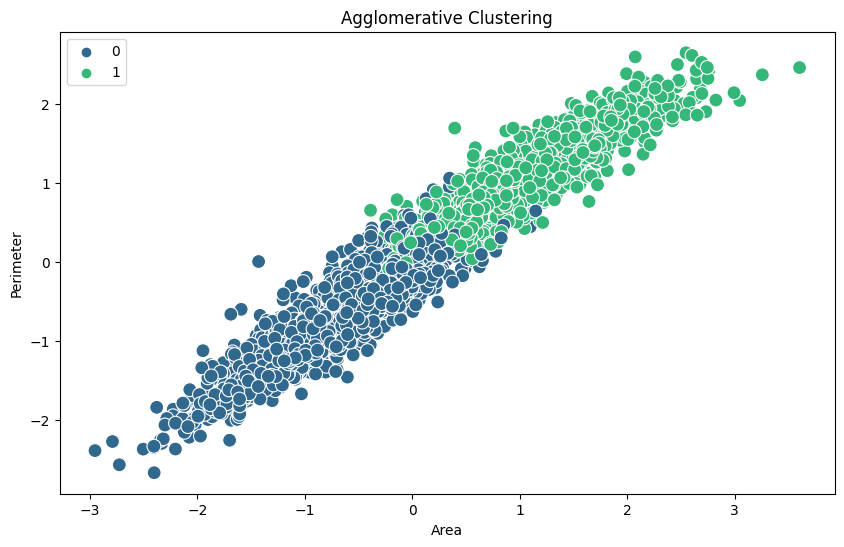

Optimal Value of k from Silhouette Score: 2 with score: 0.39546058085688846
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.9655797474697546
Optimal Value of k from Calinski Harabasz Index: 2 with score: 3264.7538484841057
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.5143881240751659
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.8180012815728576
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.6228344303285032
Dunn Index values for different K values: [0.0116122095, 0.0096307285, 0.0096307285]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


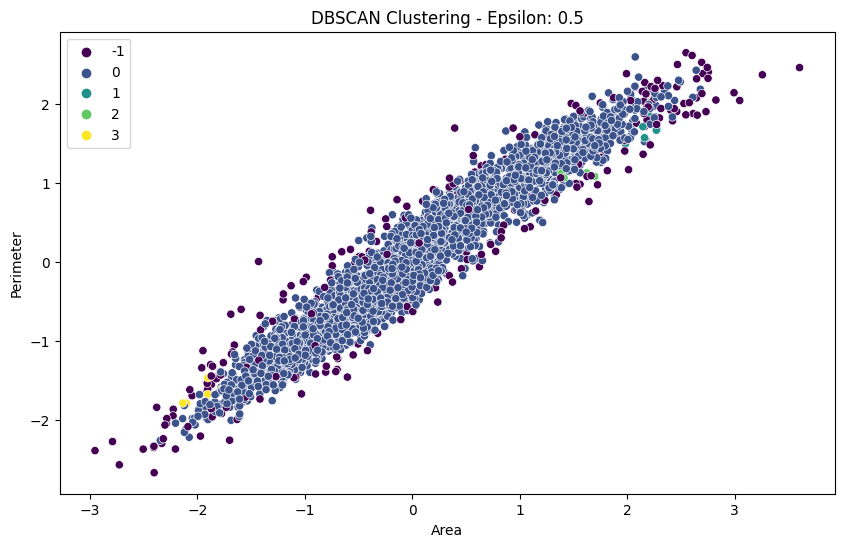

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.024262458966046015
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 5.1994425924008025
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 13.248051475955648
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.00615575549803791
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.668934152700387
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.007162094555255835
Optimal Value of epsilon from Silhouette Score: 1.0 with score: 0.4428035076647229
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 5.1994425924008025
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 13.248051475955648
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.00615575549803791
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.668934152700387
Optimal Value of epsilon from Adjusted 

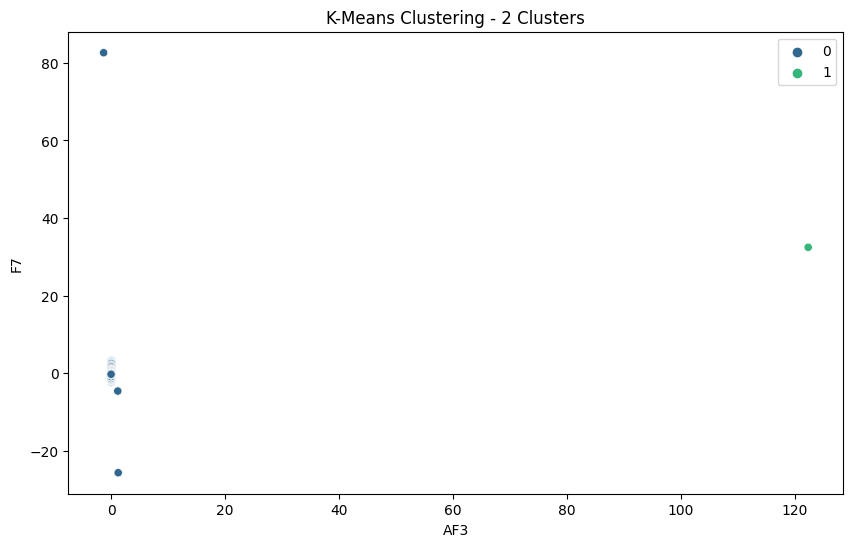

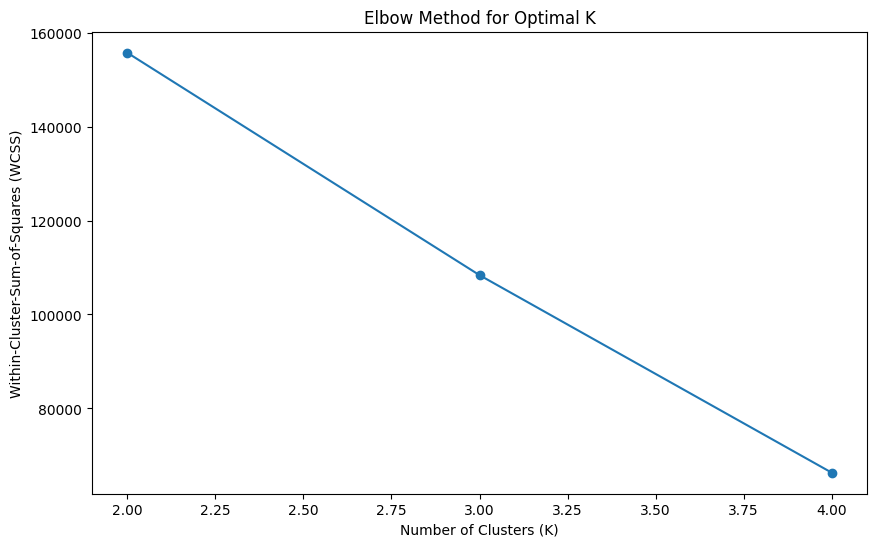



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.9916648373910644
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.005688525171257027
Optimal Value of k from Calinski Harabasz Index: 4 with score: 11073.001018620036
Optimal Value of k from Adjusted Mutual Info: 2 with score: 2.1969248596052363e-05
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7107445391745477
Optimal Value of k from Adjusted Rand Score: 2 with score: 3.046345867582477e-05
Dunn Index values for different K values: [0.7268609, 0.66020024, 0.6229171]
Optimal K based on Dunn Index: 2





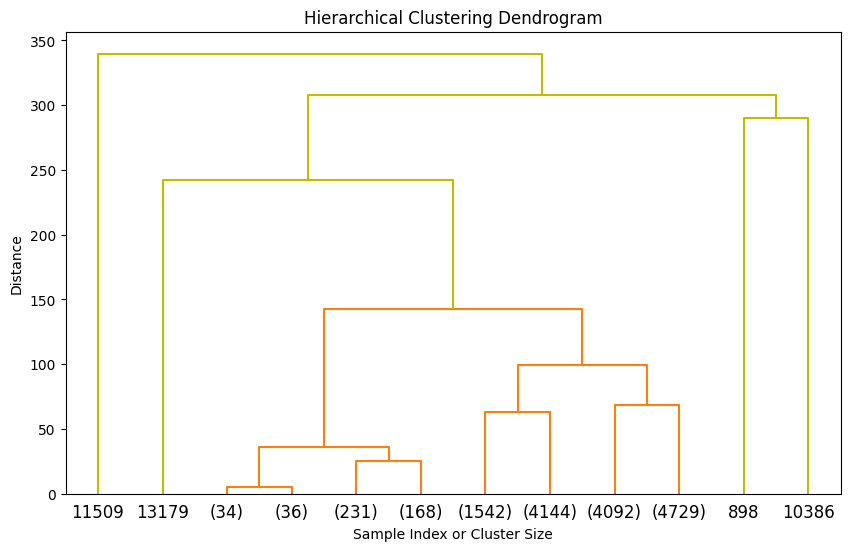


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


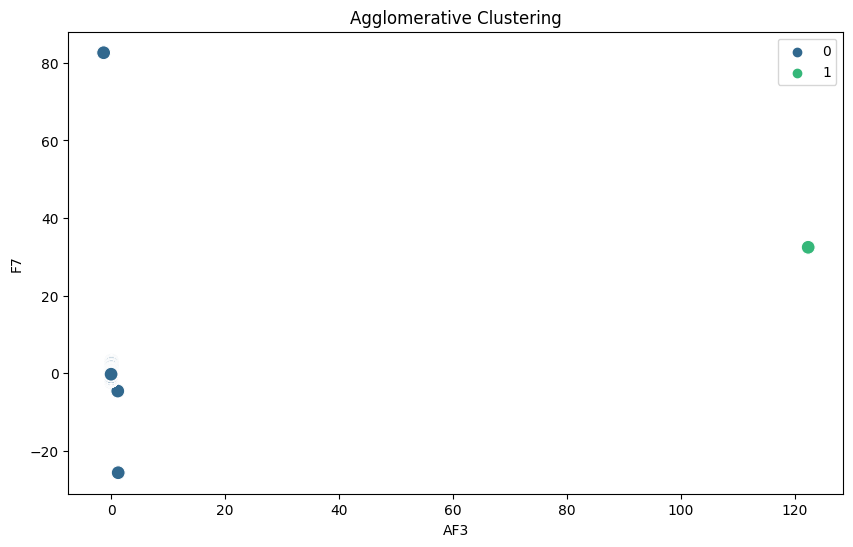

Optimal Value of k from Silhouette Score: 2 with score: 0.9923203580361138
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.005171415423045347
Optimal Value of k from Calinski Harabasz Index: 4 with score: 11728.156945479115
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.00011897506468372502
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7107445391745477
Optimal Value of k from Adjusted Rand Score: 2 with score: 3.046345867582477e-05
Dunn Index values for different K values: [0.7268579, 0.6229126, 0.6229126]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


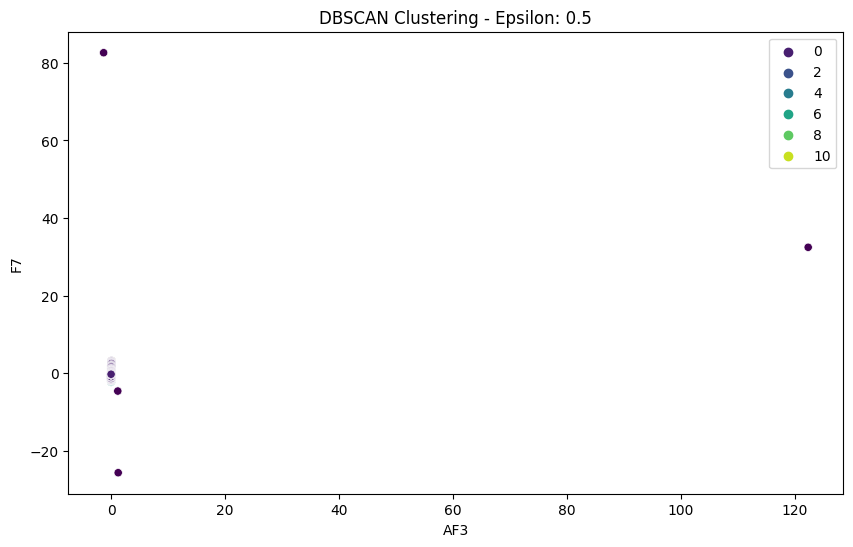

Optimal Value of epsilon from Silhouette Score: 0.5 with score: 0.2193921041068388
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 2.621676042870477
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 22.033512174011527
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.01799102435080921
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.694442628684608
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: -0.0035279182032934763
Optimal Value of epsilon from Silhouette Score: 1.0 with score: 0.9912160589996722
Optimal Value of epsilon from Davies Bouldin Index: 1.0 with score: 1.8572784733052257
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 3523.656732736671
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.01799102435080921
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.694442628684608
Optimal Value of epsilon from Adjusted Ran

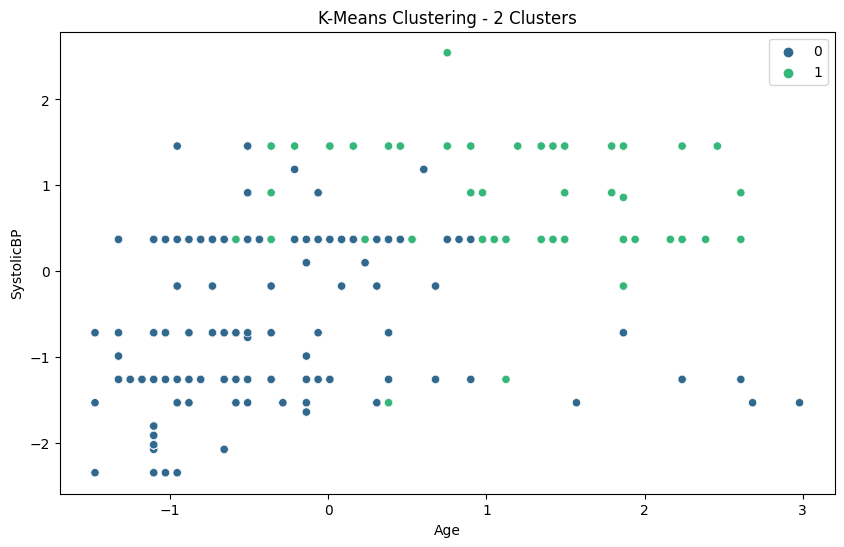

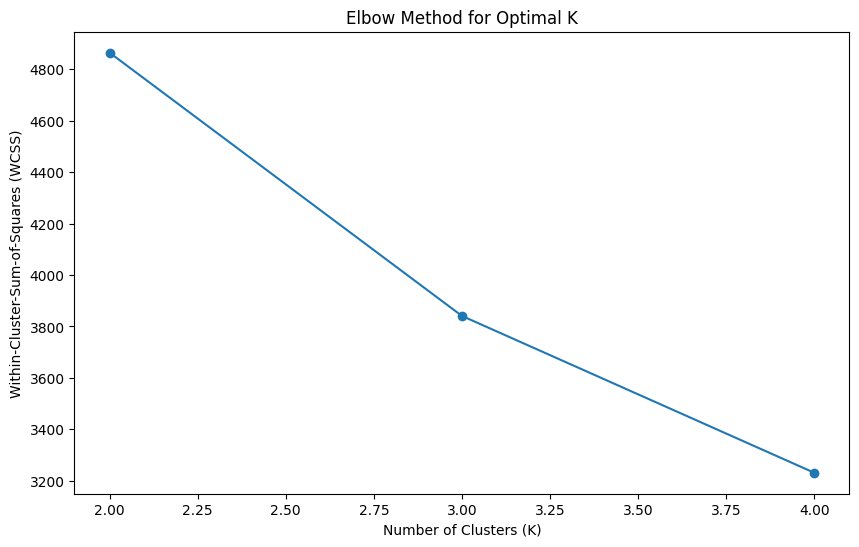



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.2932936518740769
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.2902732266631842
Optimal Value of k from Calinski Harabasz Index: 2 with score: 379.26482002241886
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.20967474481731652
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.5745131849296996
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.20815776795995225
Dunn Index values for different K values: [0.052376516, 0.06310878, 0.07088771]
Optimal K based on Dunn Index: 4





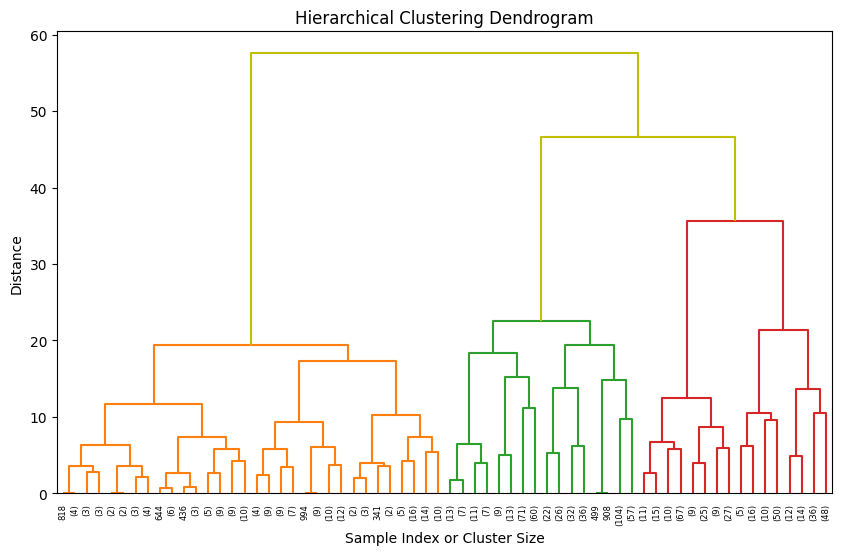


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


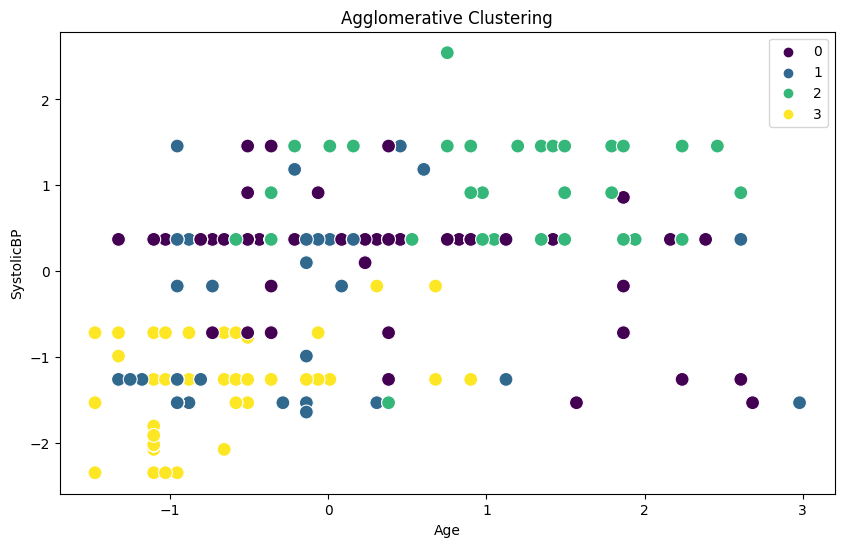

Optimal Value of k from Silhouette Score: 4 with score: 0.2954720571884273
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.1315881250140984
Optimal Value of k from Calinski Harabasz Index: 4 with score: 389.3164828101974
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.19695351295765726
Optimal Value of k from Fowlkes Mallows Score: 3 with score: 0.43974767303447476
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.15848864057178091
Dunn Index values for different K values: [0.06335554, 0.06335554, 0.06335554]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


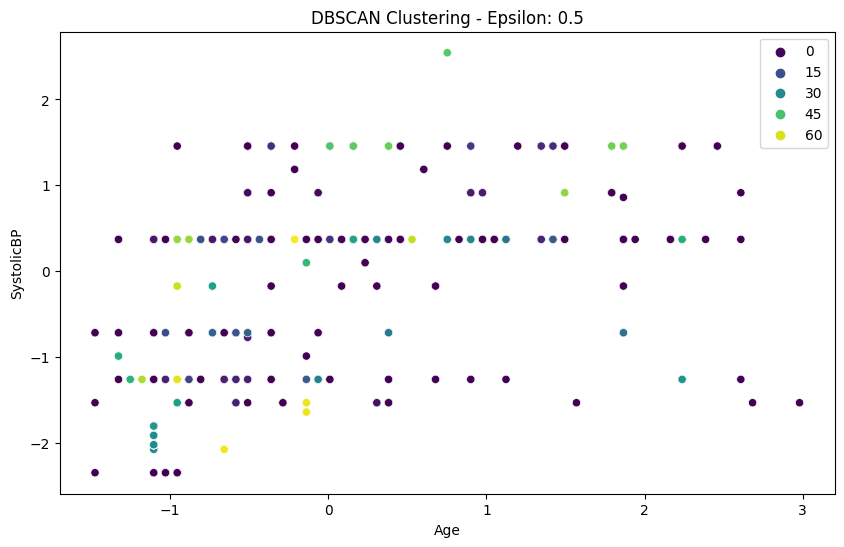

Optimal Value of epsilon from Silhouette Score: 0.5 with score: 0.3743301287823194
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.221652450187304
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 34.148190613557816
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.16371671749479397
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.18867099106309498
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.024244938808030754
Optimal Value of epsilon from Silhouette Score: 0.5 with score: 0.3743301287823194
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.221652450187304
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 54.278124717187055
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.22243420789571008
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.18867099106309498
Optimal Value of epsilon from Adjusted R

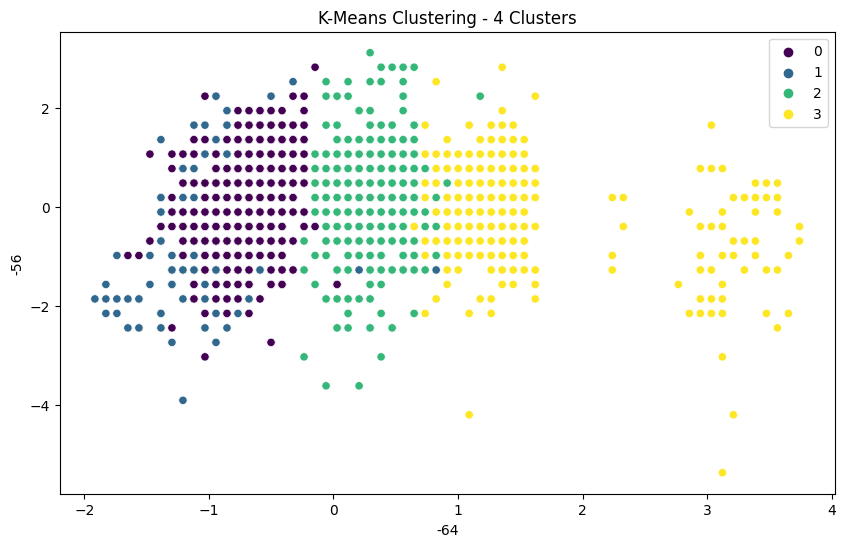

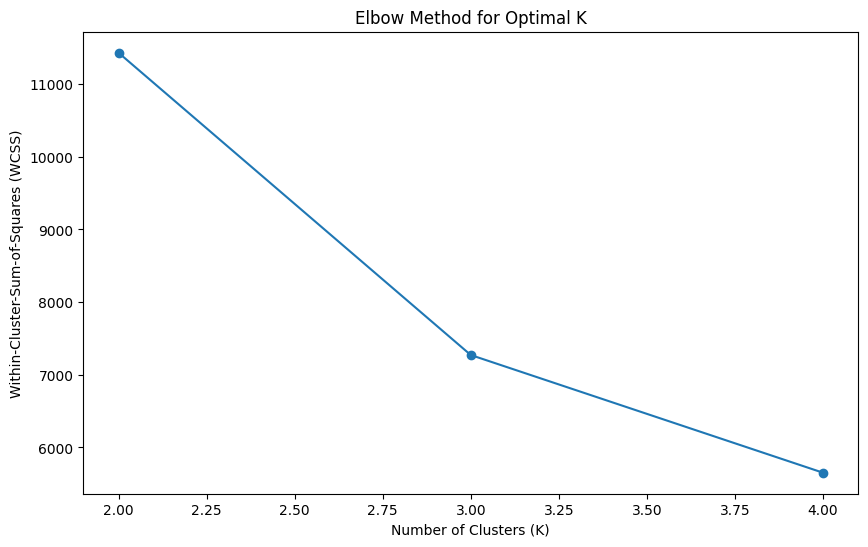



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 3 with score: 0.39192068726174223
Optimal Value of k from Davies Bouldin Index: 3 with score: 0.9702279049617252
Optimal Value of k from Calinski Harabasz Index: 4 with score: 1275.3596626732021
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.9379104256145195
Optimal Value of k from Fowlkes Mallows Score: 4 with score: 0.9594211904326394
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.9458991981875435
Dunn Index values for different K values: [0.044046517, 0.029247556, 0.03416301]
Optimal K based on Dunn Index: 2





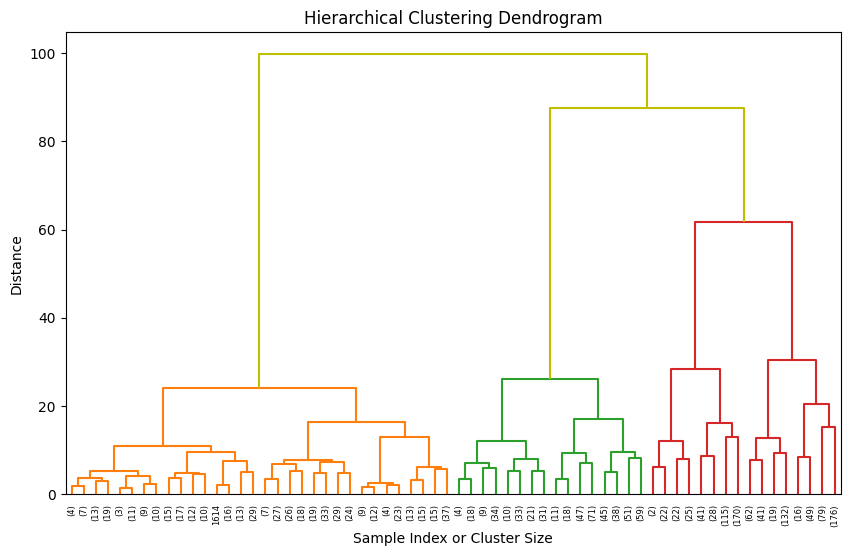


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


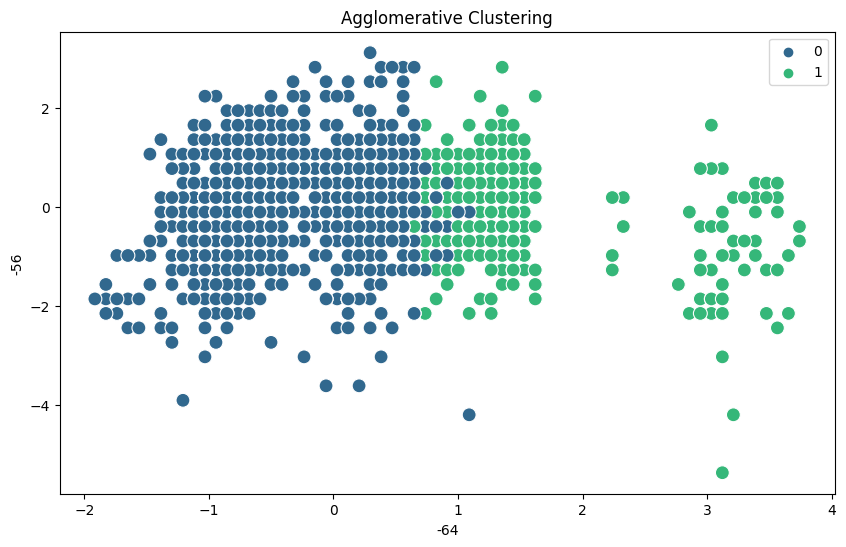

Optimal Value of k from Silhouette Score: 2 with score: 0.3514353688203872
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.0611621134051188
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1041.1158739510838
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.874481230829623
Optimal Value of k from Fowlkes Mallows Score: 4 with score: 0.9108556723236279
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.880981420193014
Dunn Index values for different K values: [0.06311112, 0.05803703, 0.05287945]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


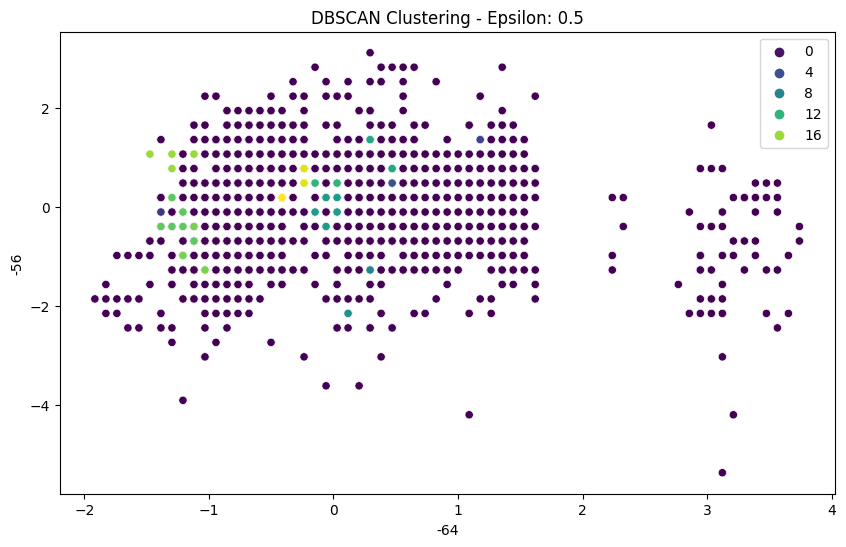

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.43460488752671467
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.5946587459812755
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 8.845518991975235
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.14023558682761675
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.44985626519091837
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.007432122937332004
Optimal Value of epsilon from Silhouette Score: 1.0 with score: -0.13718533360687407
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.5946587459812755
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 33.08874487096857
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.14023558682761675
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.44985626519091837
Optimal Value of epsilon from Adjust

In [12]:
for dataset_name, dataset in cleaned_labeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_kmeans(dataset, 5)
    cluster_agglomerative(dataset, 5)
    cluster_dbscan(dataset)

Dataset: Facebook Dataset

Best K-Means Hyperparameters: {'init': 'k-means++', 'max_iter': 100, 'n_clusters': 2, 'random_state': 50}


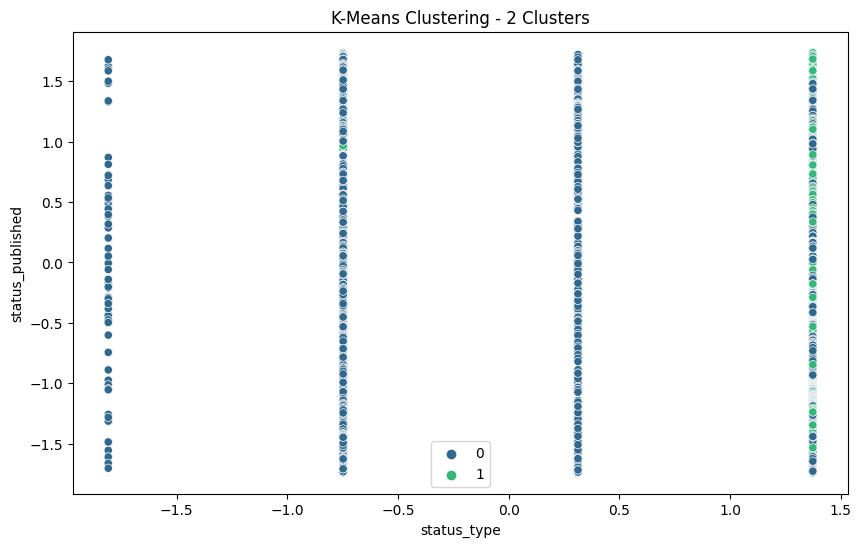

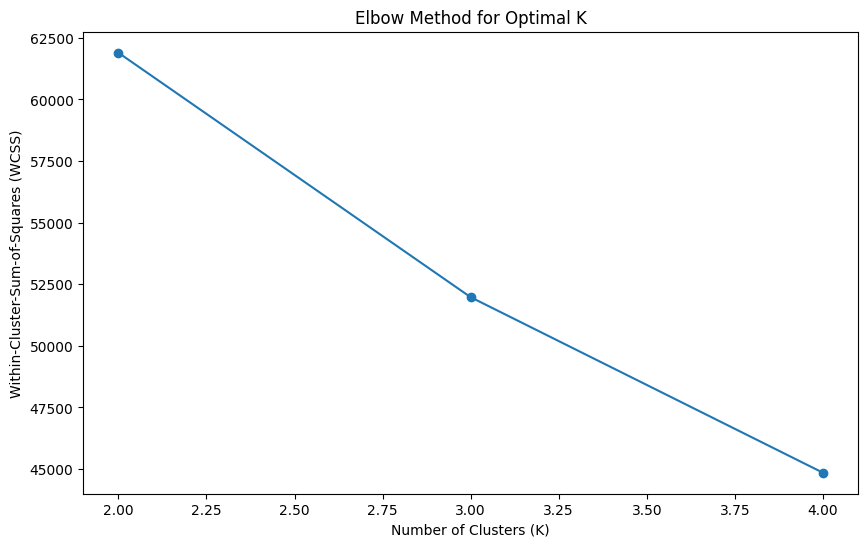



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.7032287265723169
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.1801129265176928
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1782.352151105358
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.25230629321625847
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.9485423190345046
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.4823911062026457
Dunn Index values for different K values: [0.009865099, 0.0012780124, 0.0012780124]
Optimal K based on Dunn Index: 2





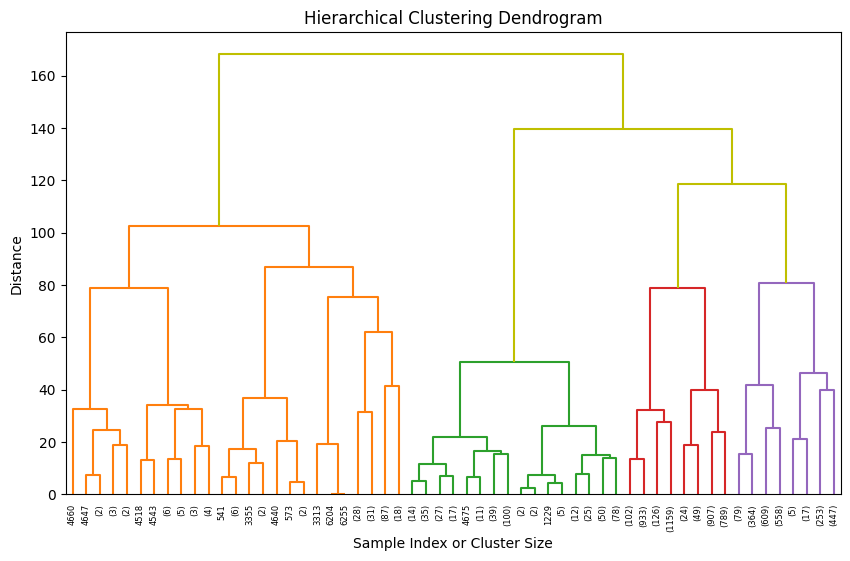


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


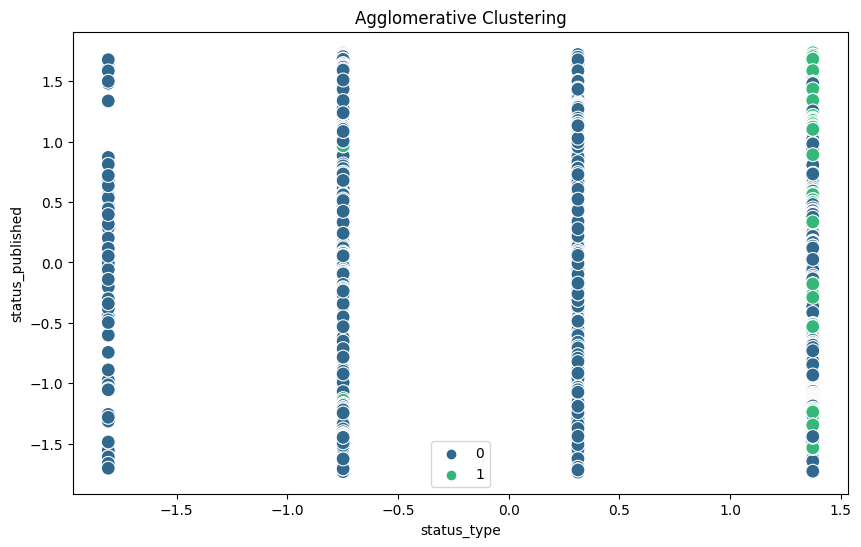

Optimal Value of k from Silhouette Score: 2 with score: 0.7217841700446479
Optimal Value of k from Davies Bouldin Index: 3 with score: 1.2634669669548362
Optimal Value of k from Calinski Harabasz Index: 4 with score: 1744.3894173970998
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.17497303573486017
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.9419786951046674
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.36809422768868055
Dunn Index values for different K values: [0.014998226, 0.0028460913, 0.0028460913]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


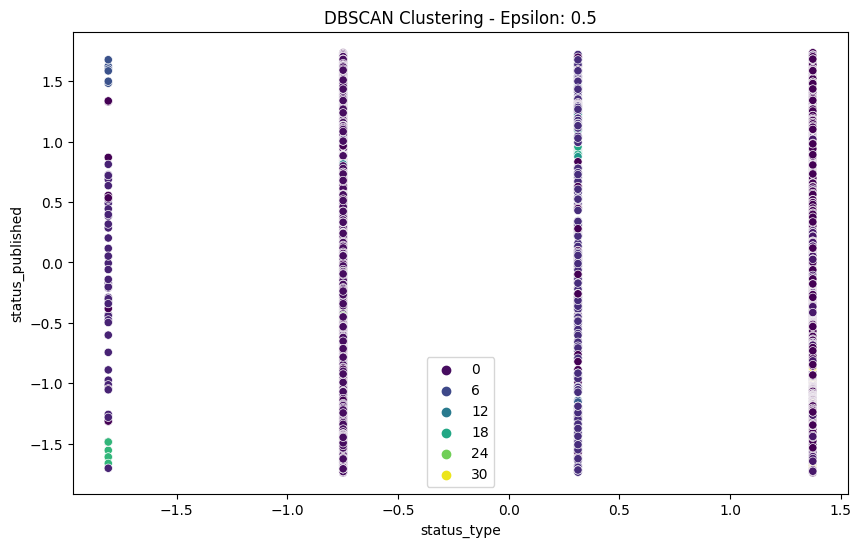

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.16781906123532894
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.436711085588035
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 103.86590836171202
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.08425205461632267
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.6157173316293367
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.08148425529110354
Optimal Value of epsilon from Silhouette Score: 1.0 with score: 0.011391049436572846
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.436711085588035
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 280.86981166229555
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.09947008369728018
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.6157173316293367
Optimal Value of epsilon from Adjusted 

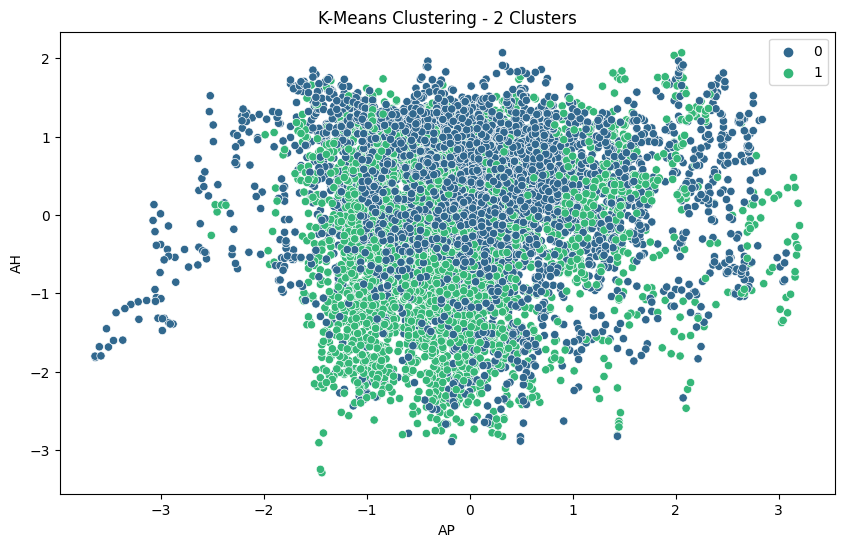

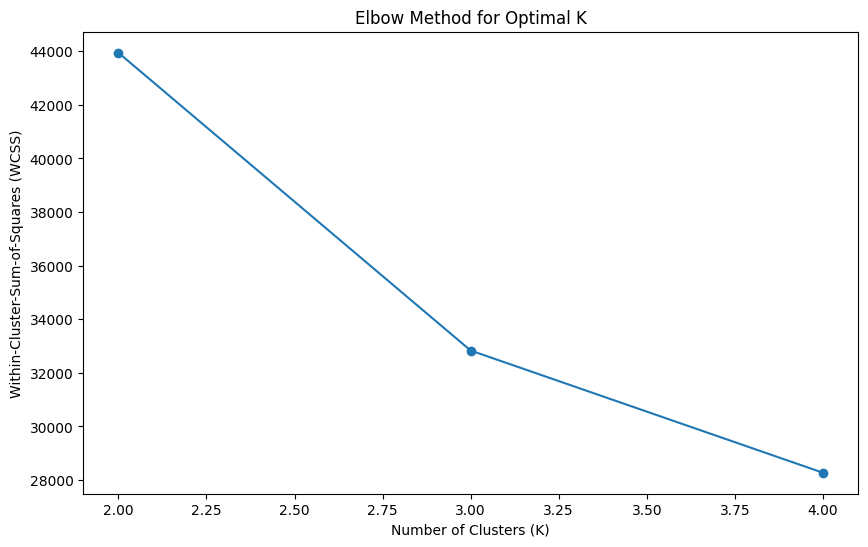



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.35465528802127555
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.072330849254841
Optimal Value of k from Calinski Harabasz Index: 2 with score: 5021.434951165285
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.0036497085851716978
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.004423194717369763
Optimal Value of k from Adjusted Rand Score: 3 with score: 1.5985266956611866e-05
Dunn Index values for different K values: [0.0054789465, 0.004678732, 0.0066315155]
Optimal K based on Dunn Index: 4





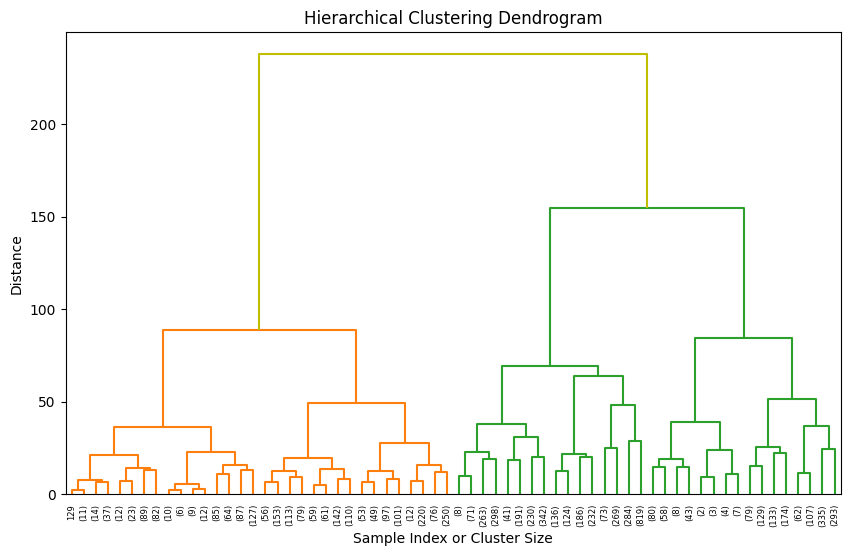


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


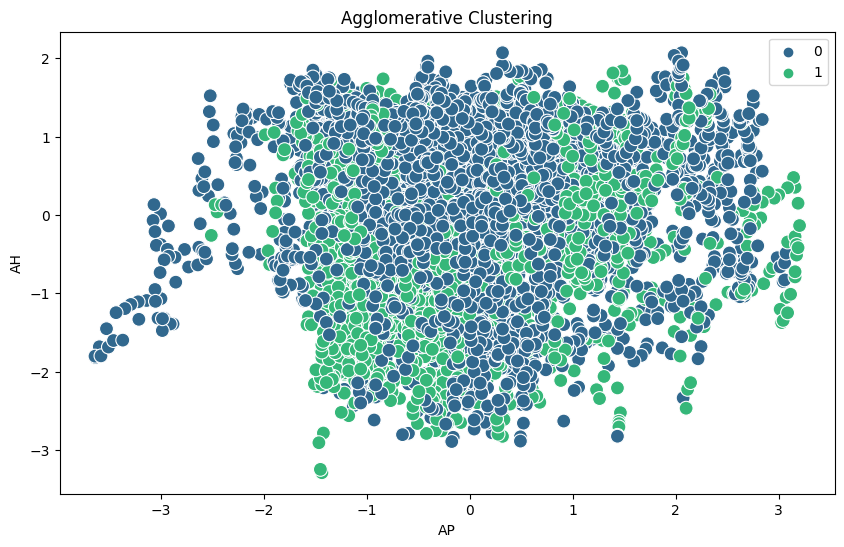

Optimal Value of k from Silhouette Score: 2 with score: 0.3839830815611031
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.9674135924297255
Optimal Value of k from Calinski Harabasz Index: 3 with score: 5132.309474821385
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.0032452810914358086
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.0044834478568620394
Optimal Value of k from Adjusted Rand Score: 3 with score: 1.3713044521502728e-05
Dunn Index values for different K values: [0.016165936, 0.013998115, 0.013998115]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


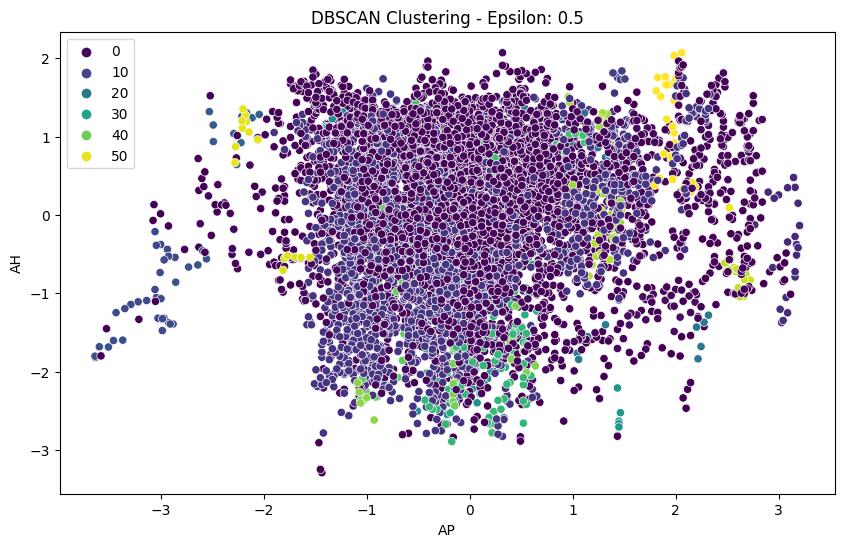

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.3706427535696055
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.2819193014008248
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 107.90300158608204
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.0027952318525413756
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.004120370192792797
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 1.2923905162369833e-05
Optimal Value of epsilon from Silhouette Score: 1.0 with score: -0.17150340751389023
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.2819193014008248
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 107.90300158608204
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.0027952318525413756
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.004120370192792797
Optimal Value of epsilon fr

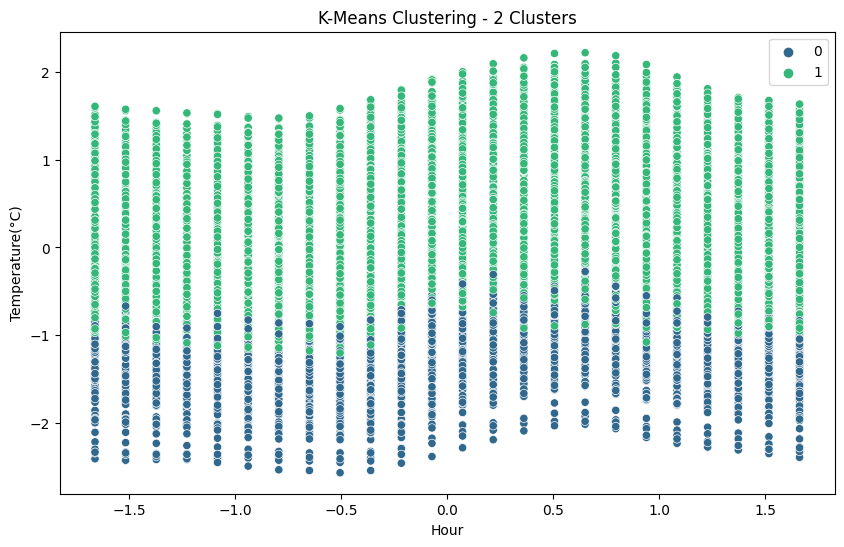

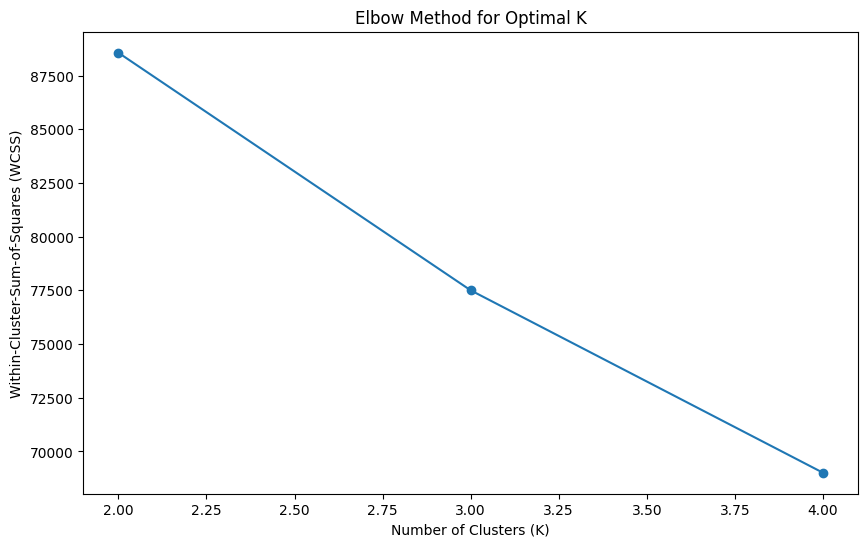



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.21562833624854183
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.4949051471367645
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1637.5411680822137
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.21984096935229713
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7375927188939768
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.06434814489161084
Dunn Index values for different K values: [0.0036998123, 0.0035476815, 0.0035476815]
Optimal K based on Dunn Index: 2





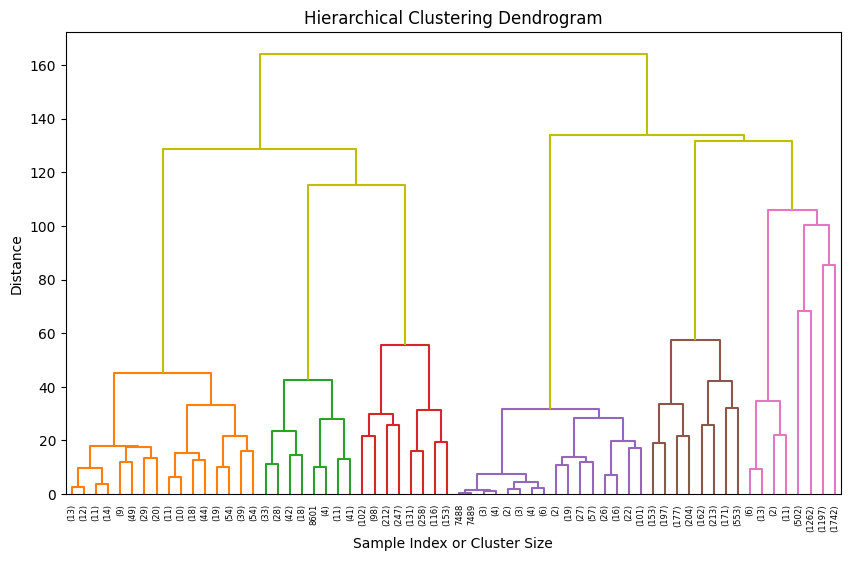


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


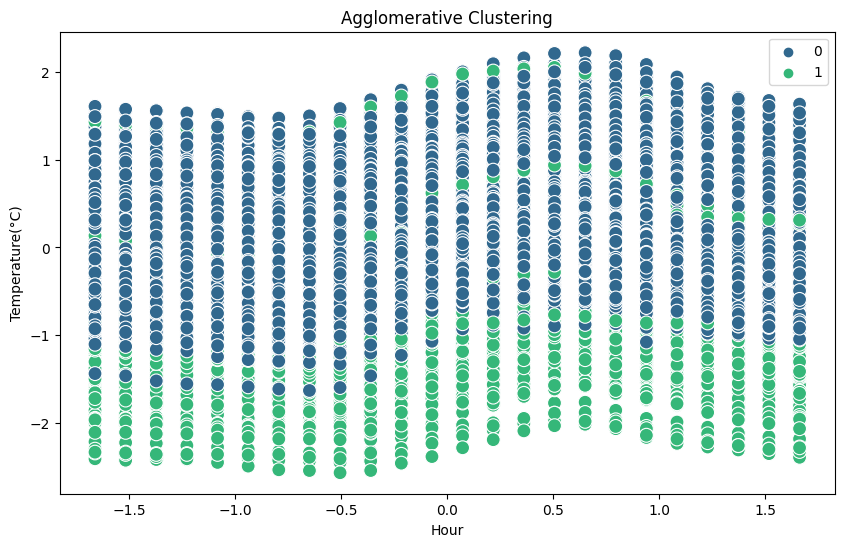

Optimal Value of k from Silhouette Score: 2 with score: 0.2442646848774406
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.5788263329131165
Optimal Value of k from Calinski Harabasz Index: 2 with score: 1600.9143804055248
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.013000272203657879
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.7414703978411087
Optimal Value of k from Adjusted Rand Score: 3 with score: -0.003418363360617344
Dunn Index values for different K values: [0.030606527, 0.0100208735, 0.0100208735]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


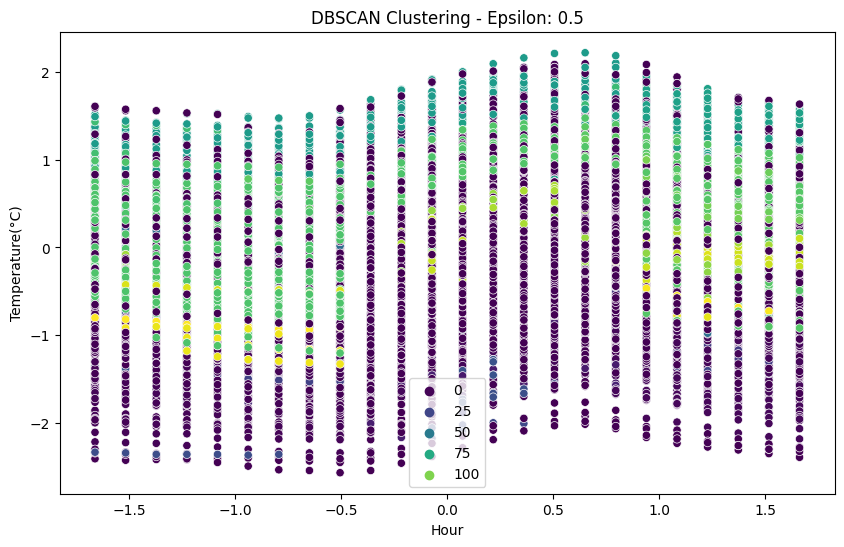

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.40905426858454763
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.360978596140389
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 29.063932527753735
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.018613955896006073
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.53205123093951
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.008073136655922462
Optimal Value of epsilon from Silhouette Score: 1.0 with score: -0.018880027238906454
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.360978596140389
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 117.2461470442021
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.02031064344646216
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.53205123093951
Optimal Value of epsilon from Adjusted Ra

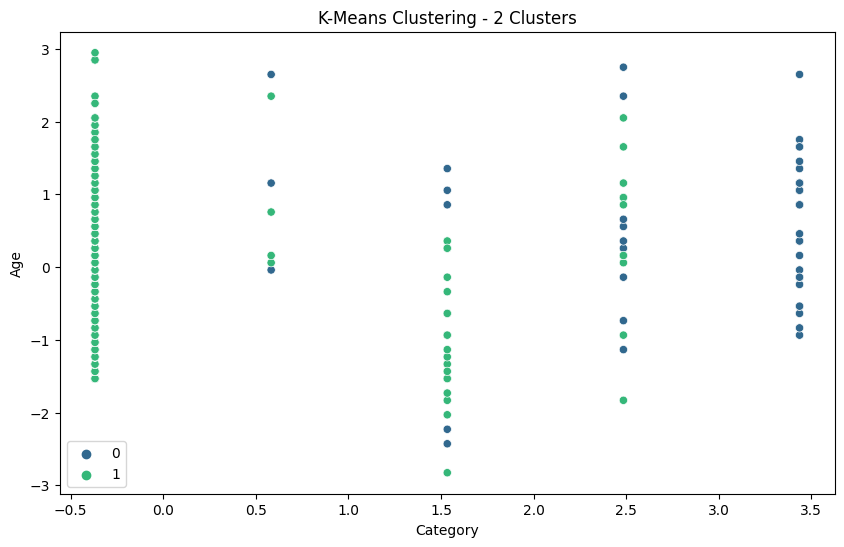

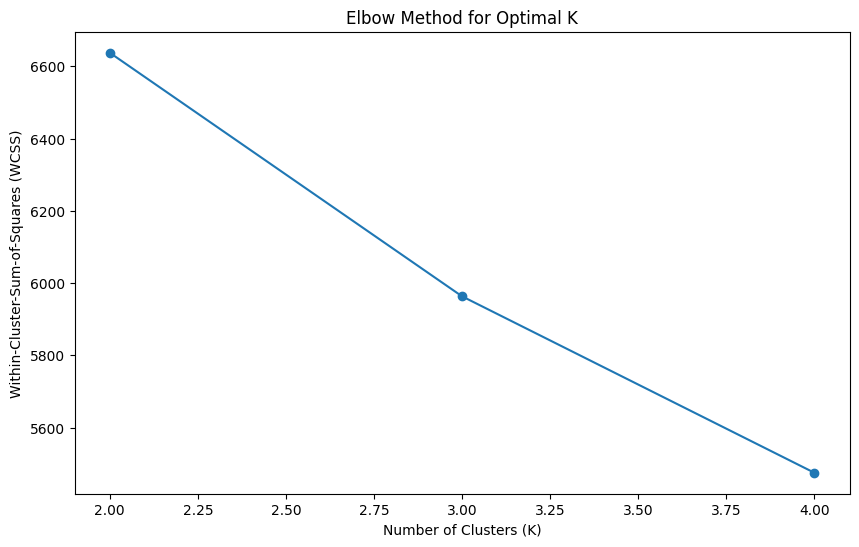



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.5429434738892241
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.6324026429830467
Optimal Value of k from Calinski Harabasz Index: 2 with score: 125.36679774509528
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.017544098778355742
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.07701413915087921
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.0007446447335813715
Dunn Index values for different K values: [0.08746574, 0.078534275, 0.078534275]
Optimal K based on Dunn Index: 2





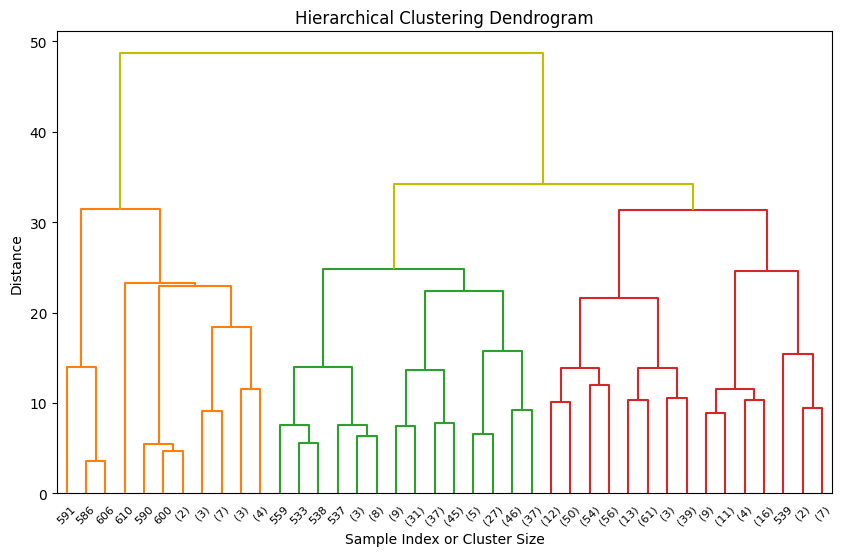


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


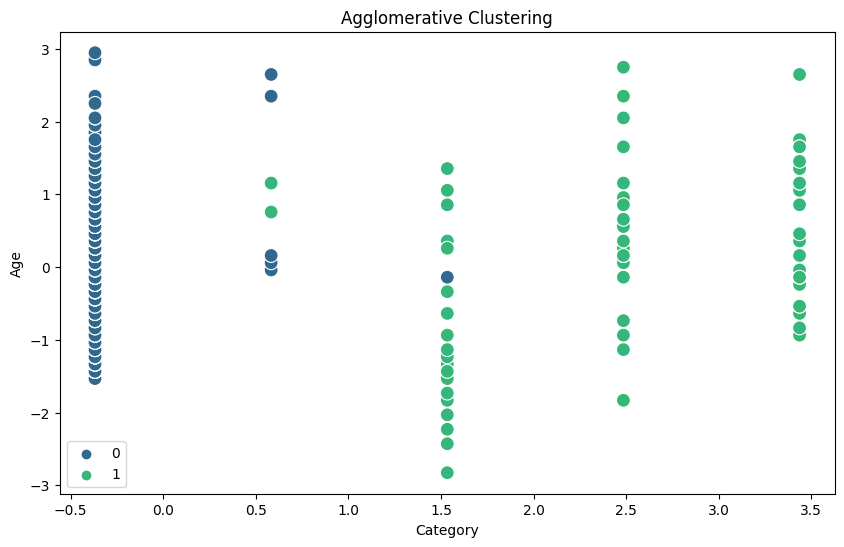

Optimal Value of k from Silhouette Score: 2 with score: 0.46001432665062786
Optimal Value of k from Davies Bouldin Index: 2 with score: 1.847512265666576
Optimal Value of k from Calinski Harabasz Index: 2 with score: 114.96759191466462
Optimal Value of k from Adjusted Mutual Info: 2 with score: 0.023426839162467506
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.0761980105369038
Optimal Value of k from Adjusted Rand Score: 2 with score: 0.0011252188415710558
Dunn Index values for different K values: [0.07674173, 0.048327956, 0.048327956]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


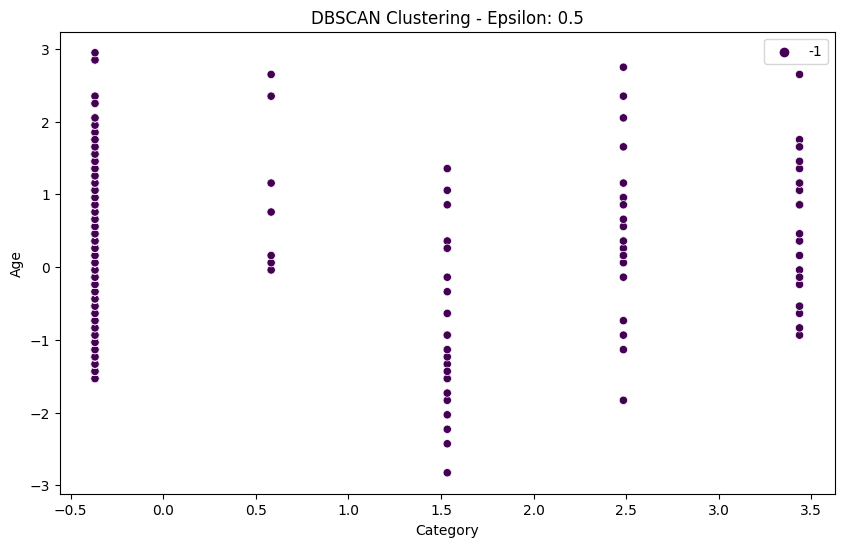

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.2097692607769426
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 2.509420641712552
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 8.019276806695592
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: -0.012537803601710857
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.0509792564609689
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: -0.00101292056129387
Optimal Value of epsilon from Silhouette Score: 1.0 with score: 0.1311473052104586
Optimal Value of epsilon from Davies Bouldin Index: 1.0 with score: 2.50190202086646
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 62.72059967779049
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.009669321598016199
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.04917842975595865
Optimal Value of epsilon from Adjusted R

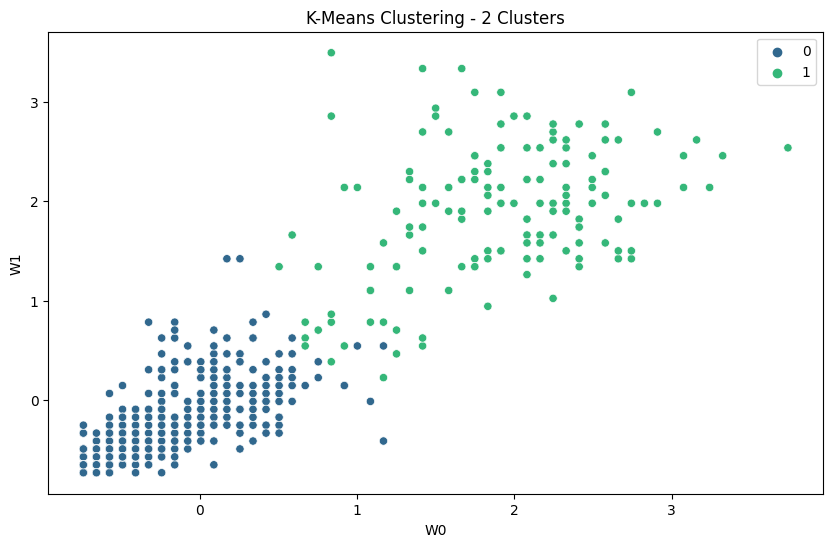

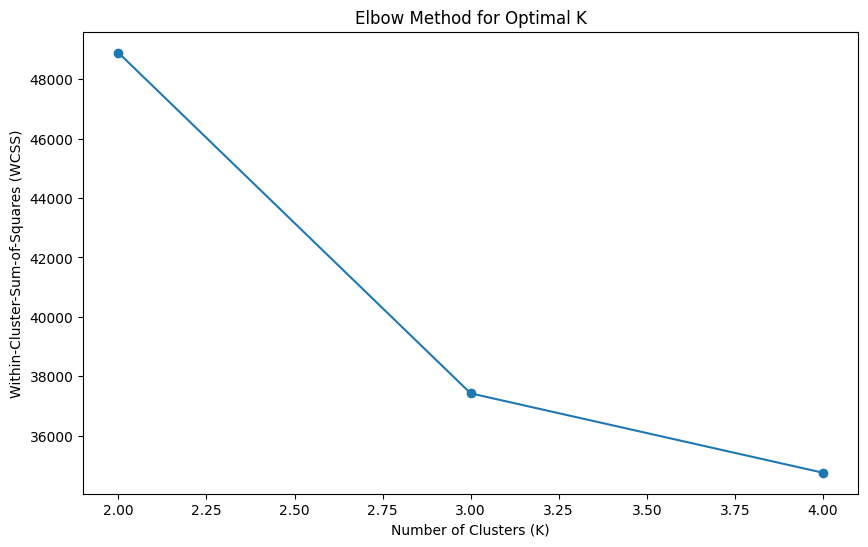



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.45151374357744545
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.855886311271444
Optimal Value of k from Calinski Harabasz Index: 2 with score: 613.5914650369867
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.18261093052839233
Optimal Value of k from Fowlkes Mallows Score: 4 with score: 0.3030652864388398
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.1505416890178951
Dunn Index values for different K values: [0.18004322, 0.17180638, 0.14439555]
Optimal K based on Dunn Index: 2





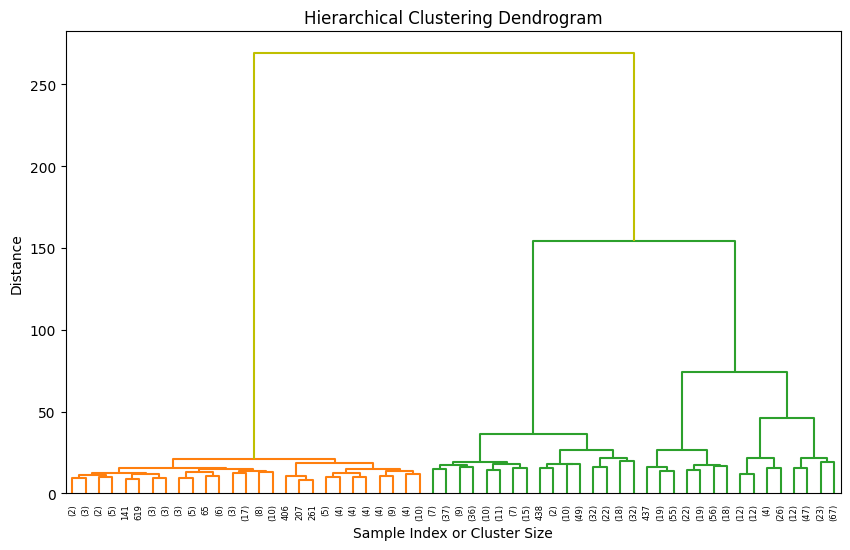


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


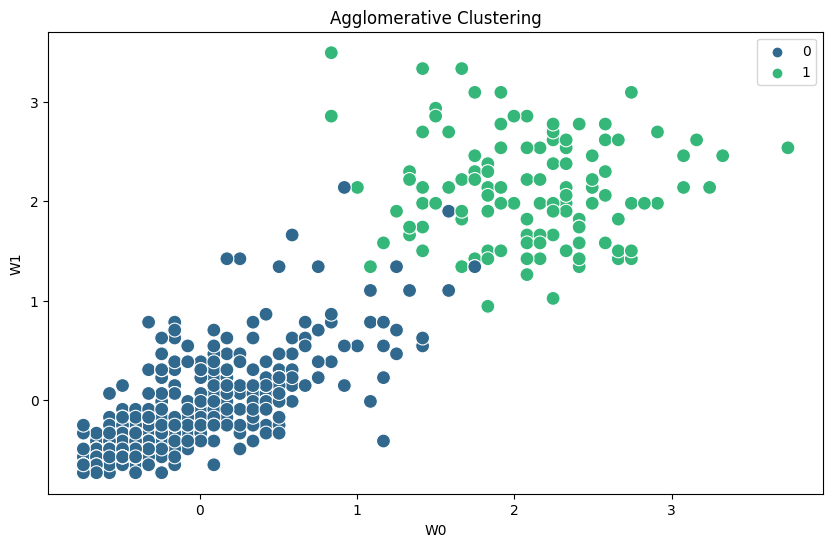

Optimal Value of k from Silhouette Score: 2 with score: 0.47509661798812697
Optimal Value of k from Davies Bouldin Index: 2 with score: 0.76686891348209
Optimal Value of k from Calinski Harabasz Index: 2 with score: 594.9739728331764
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.18440950440990259
Optimal Value of k from Fowlkes Mallows Score: 4 with score: 0.3138717678196872
Optimal Value of k from Adjusted Rand Score: 4 with score: 0.15742931373689992
Dunn Index values for different K values: [0.25851843, 0.16618426, 0.16618426]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


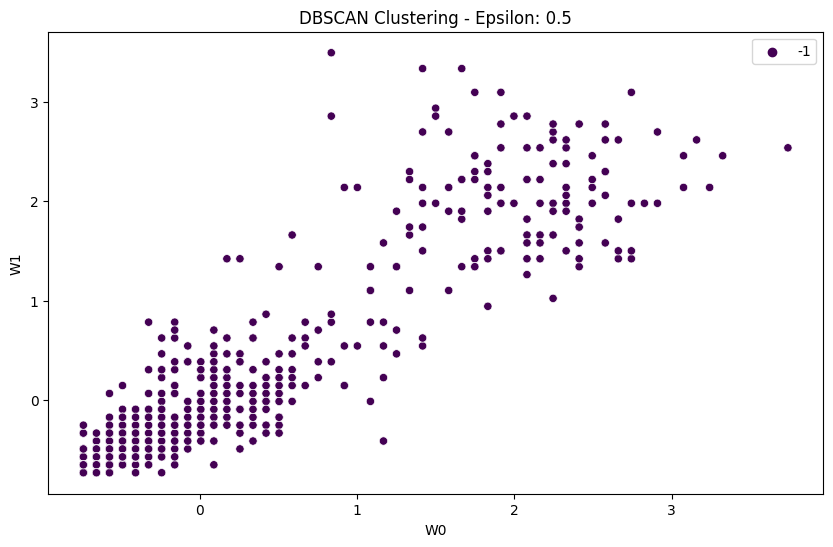

Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.03779500937170363
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.4377298644903371
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 24.874028012980936
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.0014958383404594957
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.24810122508379523
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: -0.0174994386244567
Optimal Value of epsilon from Silhouette Score: 0.5 with score: -0.03779500937170363
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.4377298644903371
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 32.372376150161635
Optimal Value of epsilon from Adjusted Mutual Info: 1.0 with score: 0.023827312975050696
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.20658876566996626
Optimal Value of epsilon from Ad

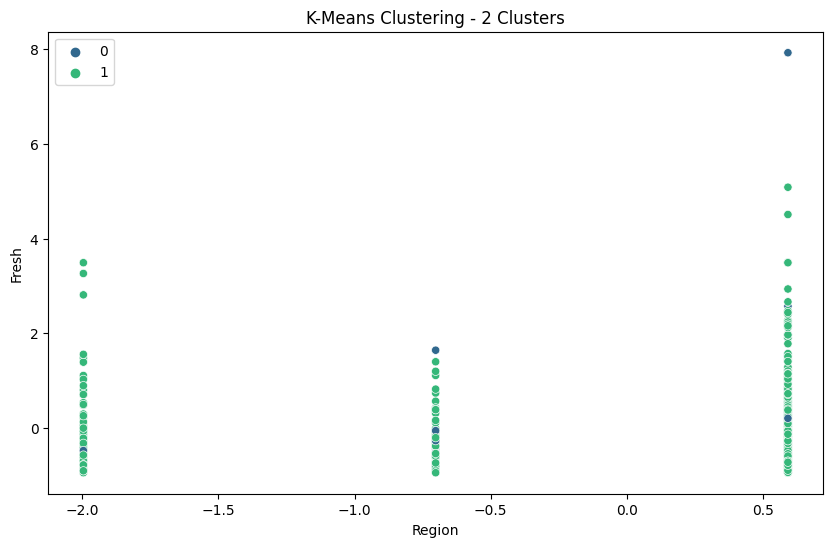

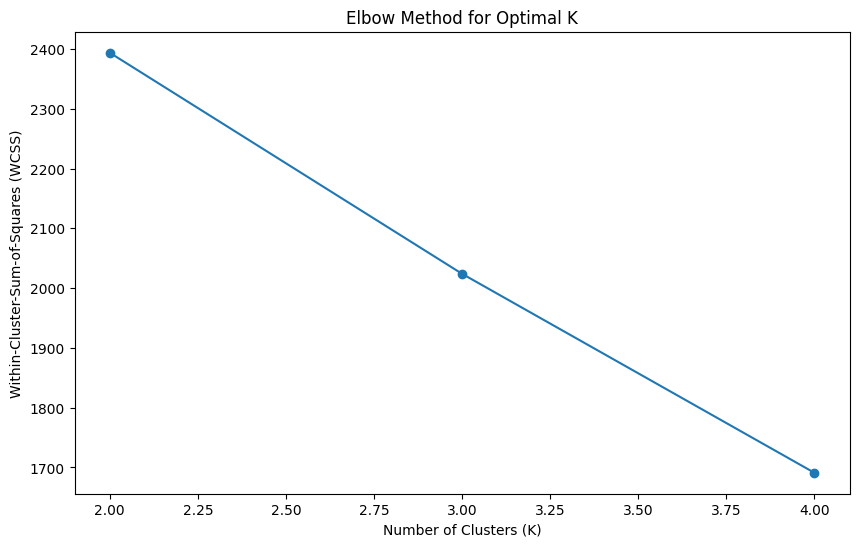



Best K value from Elbow Method: 2
Optimal Value of k from Silhouette Score: 2 with score: 0.5045742047996264
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.1218657223457802
Optimal Value of k from Calinski Harabasz Index: 2 with score: 125.5617089132267
Optimal Value of k from Adjusted Mutual Info: 3 with score: 0.006435380334378789
Optimal Value of k from Fowlkes Mallows Score: 3 with score: 0.020133576115230246
Optimal Value of k from Adjusted Rand Score: 3 with score: 0.00025588304486719
Dunn Index values for different K values: [0.018723926, 0.028508041, 0.018723926]
Optimal K based on Dunn Index: 3





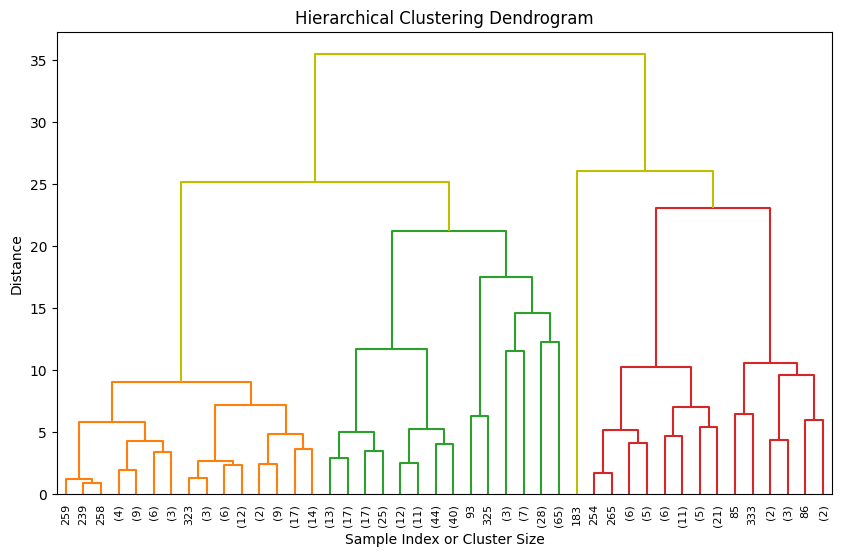


Best Agglomerative Clustering Hyperparameters: {'linkage': 'ward', 'n_clusters': 2}


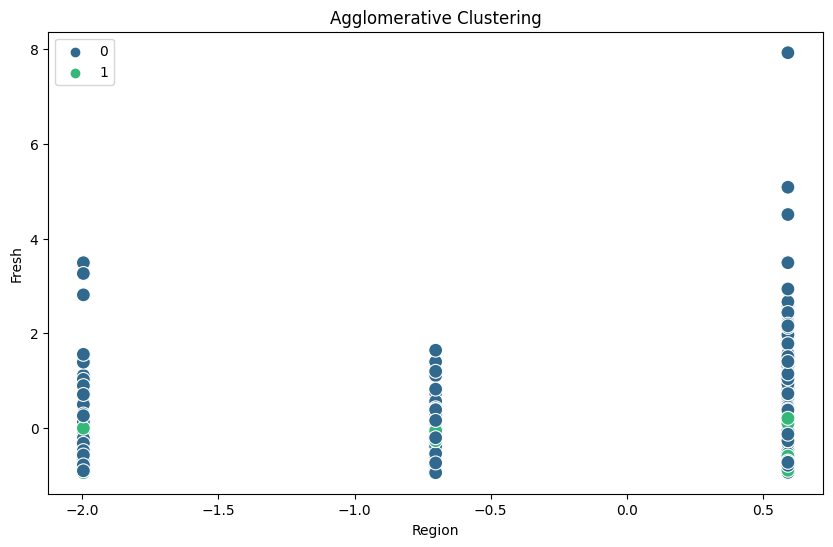

Optimal Value of k from Silhouette Score: 2 with score: 0.36993137244732255
Optimal Value of k from Davies Bouldin Index: 4 with score: 1.1170287633150489
Optimal Value of k from Calinski Harabasz Index: 2 with score: 135.64761547507385
Optimal Value of k from Adjusted Mutual Info: 4 with score: 0.0014281739965311584
Optimal Value of k from Fowlkes Mallows Score: 2 with score: 0.019167167620191498
Optimal Value of k from Adjusted Rand Score: 4 with score: 6.52488769722902e-05
Dunn Index values for different K values: [0.019873371, 0.019873371, 0.019873371]
Optimal K based on Dunn Index: 2



Best DBSCAN Hyperparameters: {'eps': 0.5, 'metric': 'euclidean', 'min_samples': 5}


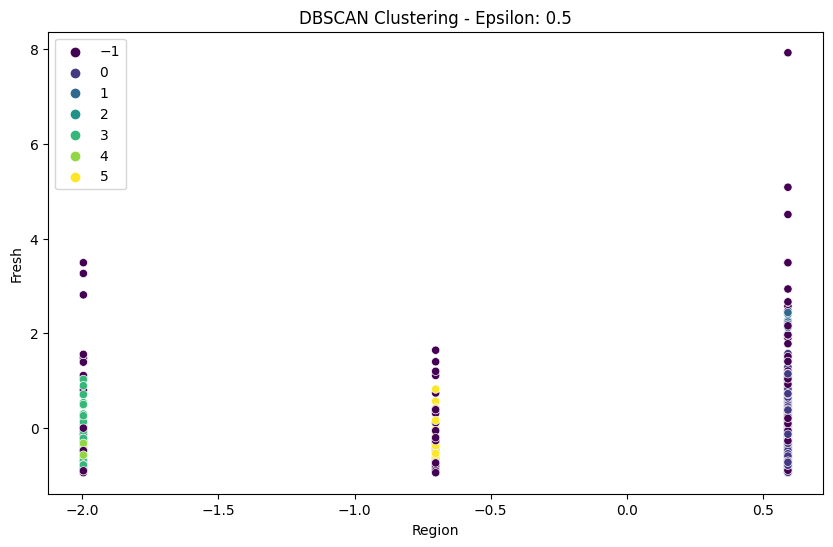

Optimal Value of epsilon from Silhouette Score: 0.5 with score: 0.04953349572602835
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.439851991616567
Optimal Value of epsilon from Calinski Harabasz Index: 0.5 with score: 23.46401734417105
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.007084614912903418
Optimal Value of epsilon from Fowlkes Mallows Score: 0.5 with score: 0.018331349224209696
Optimal Value of epsilon from Adjusted Rand Score: 0.5 with score: 0.00034275574552244053
Optimal Value of epsilon from Silhouette Score: 1.0 with score: 0.16885095865028577
Optimal Value of epsilon from Davies Bouldin Index: 0.5 with score: 1.439851991616567
Optimal Value of epsilon from Calinski Harabasz Index: 1.0 with score: 63.45881201091207
Optimal Value of epsilon from Adjusted Mutual Info: 0.5 with score: 0.007084614912903418
Optimal Value of epsilon from Fowlkes Mallows Score: 1.0 with score: 0.01654119698021456
Optimal Value of epsilon from Adjus

In [18]:
for dataset_name, dataset in cleaned_unlabeled_datasets:
    print("==================================================")
    print("Dataset:", dataset_name)
    print("==================================================")
    cluster_kmeans(dataset, 5)
    cluster_agglomerative(dataset, 5)
    cluster_dbscan(dataset)